In [1]:
import pandas as pd
import numpy as np
import time
import datetime as dt
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.mixture import GMM
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import MeanShift
import pylab as pl
%matplotlib inline

In [2]:
# import current csv
df = pd.read_csv('data.csv', header=None,
                names=['time','temp','pressure','humidity'])

In [3]:
# import archived csv
dfo = pd.read_csv('data_old.csv', header=None,
                 names=['pressure','humidity','temp','time'])

In [4]:
# convert to date
df['time'] = df.time.apply(
    lambda x: time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(x)))

dfo['time'] = dfo.time.apply(
    lambda x: time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(x)))

In [5]:
# reorder columns in archive csv
dfo['t1'] = dfo.temp
dfo['p1'] = dfo.pressure
dfo['h1'] = dfo.humidity
del dfo['pressure']
del dfo['humidity']
del dfo['temp']
dfo.columns = ['time','temp','pressure','humidity']

In [6]:
# append both dfs
dfm = df.append(dfo)

In [7]:
# sort
dfm = dfm.sort('time').reset_index(drop=True) # for use on cusp compute
# dfm = dfm.sort_values('time').reset_index(drop=True) # for use on laptop

/Users/Daynan/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  from ipykernel import kernelapp as app


In [8]:
# add date and hour columns
dfm['datetime'] = dfm.time.apply(lambda x: pd.to_datetime(x))
dfm['date'] = dfm.datetime.dt.date
dfm['hour'] = dfm.datetime.dt.hour
dfm['minute'] = dfm.datetime.dt.minute
dfm['day_hour'] = dfm.time.apply(lambda x: x[:-6])

In [9]:
# rate of change
dfm['d_temp']=dfm['temp'].diff()
dfm['d_humidity']=dfm['humidity'].diff()
dfm['d_pressure']=dfm['pressure'].diff()
dfm['d2_temp']=dfm['d_temp'].diff()
dfm['d2_humidity']=dfm['d_humidity'].diff()
dfm['d2_pressure']=dfm['d_pressure'].diff()

In [10]:
def plot(_df,field,norm=False):
#     fig = plt.figure(figsize(15,5))

    if norm:
        _df.pressure = (_df.pressure - _df.pressure.mean())*1.0/_df.pressure.std()
        _df.humidity = (_df.humidity - _df.humidity.mean())*1.0/_df.humidity.std()
        _df['temp'] = (_df['temp'] - _df['temp'].mean())*1.0/_df['temp'].std()
    
    if field=='all':
        plt.plot(_df['temp'],label='T')
        plt.plot(_df['pressure'],label='P')
        plt.plot(_df['humidity'],label='H')
        # plt.axis([900,950,-2,2])
        plt.legend(loc=2);
    else:
        plt.plot(_df[field]);

In [11]:
def normit(data):
    n = data.copy()
    n["pressure"] = (data.pressure - data.pressure.mean())*1.0/data.pressure.std()
    n["humidity"] = (data.humidity - data.humidity.mean())*1.0/data.humidity.std()
    n['temp'] = (data['temp'] - data['temp'].mean())*1.0/data['temp'].std()
    return n

In [12]:
df_norm = normit(dfm)

In [13]:
# difference b/t temp and humidity
df_norm['h_t'] = df_norm.humidity-df_norm.temp

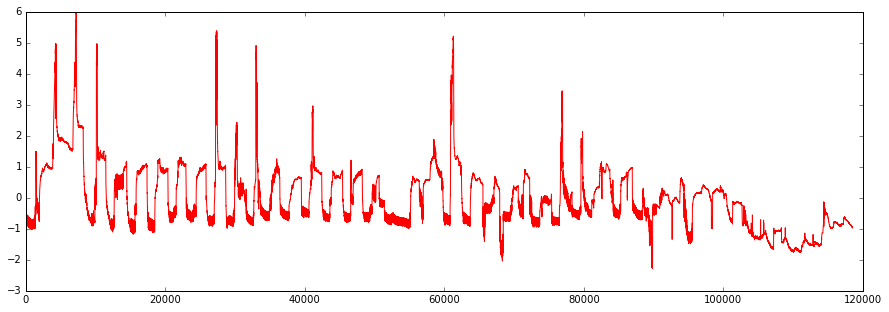

In [14]:
fig = plt.figure(figsize=(15,5))
plt.plot(df_norm.temp,'r');

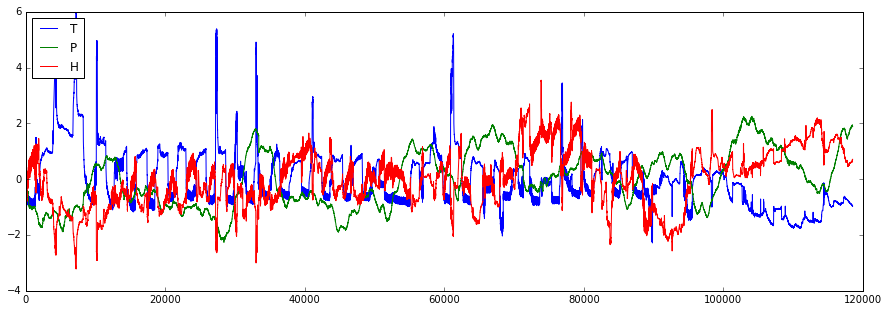

In [15]:
fig = plt.figure(figsize=(15,5))
plt.plot(df_norm['temp'],label='T')
plt.plot(df_norm['pressure'],label='P')
plt.plot(df_norm['humidity'],label='H')
# plt.axis([9500,10000,-6,6])
plt.legend(loc=2);

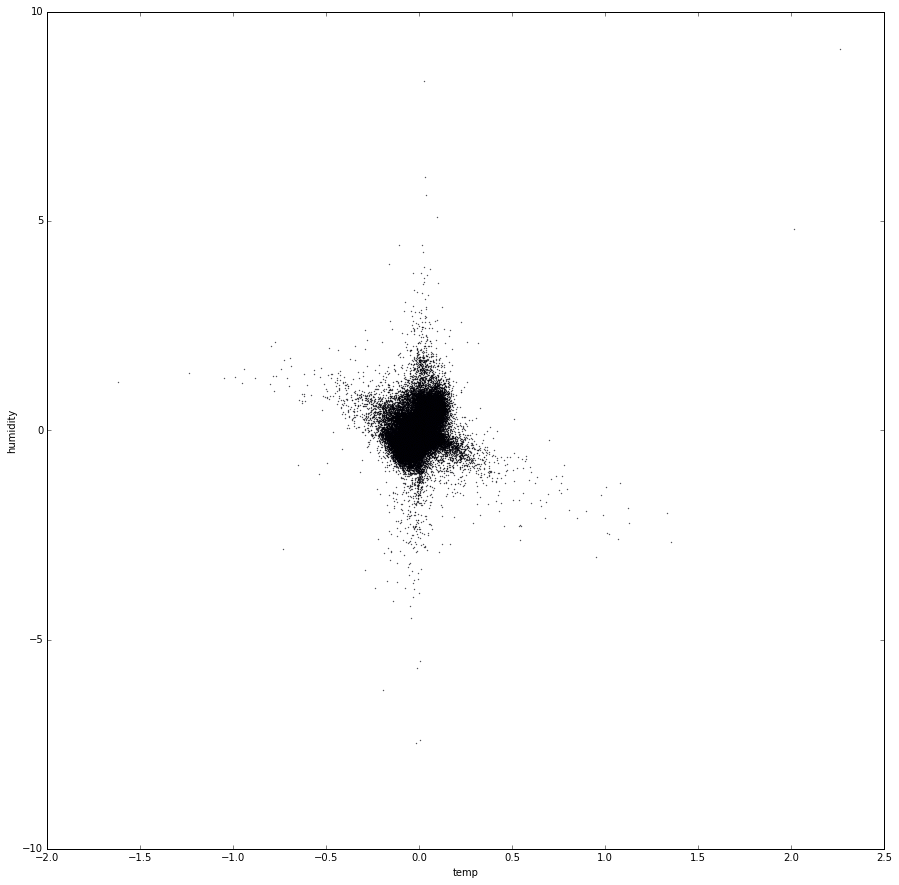

In [16]:
fig = plt.figure(figsize=(15,15))
plt.scatter(df_norm['d_temp'],df_norm['d_humidity'],s=.1)
plt.xlabel('temp')
plt.ylabel('humidity');

In [139]:
d_ht_array = np.asarray([df_norm.d_temp,df_norm.d_humidity]).T

#remove nan in 1st observation
d_ht_array_clean = d_ht_array[2:]

In [17]:
# GMM
def mygmm(data,n_comp,features):
    temp = data[[i for i in features]][2:]
    temp_results = data[2:].copy()
    g = GMM(n_components=n_comp)
    g.fit(temp.values)
    temp_results['labels'] = g.predict(temp.values)
    return temp_results,features

# Meanshift
def myms(data,features):
    temp = data[[i for i in features]][2:]
    temp_results = data[2:].copy()
    ms = MeanShift()
    ms.fit(temp.values)
    temp_results['labels'] = ms.predict(temp.values)
    return temp_results,features

In [18]:
def plot_cluster(method_return,n_cluster,plot_all=False):
    fig = plt.figure(figsize=(15,5))
    if plot_all: #plot all clusters
        temp = method_return[0].copy()
    else:
        temp = method_return[0][method_return[0]['labels']==n_cluster].copy() #plot only cluster designated
    for i in method_return[1]: #plot each feature
        plt.plot(temp.datetime,temp[str(i)],'.',label=i,alpha=.5)
        plt.legend(loc=2)
        if not plot_all:
            plt.title('cluster #{}'.format(n_cluster))
    if len(method_return[1])==2:  #plot xy plane if there are less than 2 features being evaluated
        fig = plt.figure(figsize=(7,7))
        if plot_all:
            plt.scatter(temp[method_return[1][0]],temp[method_return[1][1]], c=method_return[0]['labels'], s = 10)
        else:
            plt.scatter(temp[method_return[1][0]],temp[method_return[1][1]],s=.1)
        plt.xlabel(method_return[1][0])
        plt.ylabel(method_return[1][1]);

In [24]:
# call GMM method
gmm1 = mygmm(df_norm,2,['d_temp','d_humidity'])

In [143]:
# call MeanShift --> LONGER RUNTIME
# ms1 = myms(df_norm,['d_temp','d_humidity'])

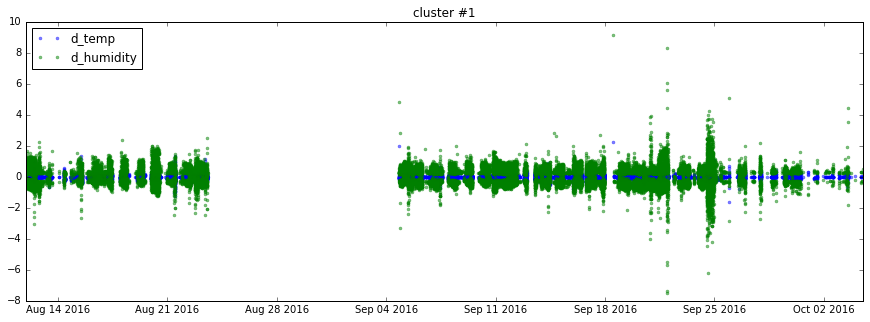

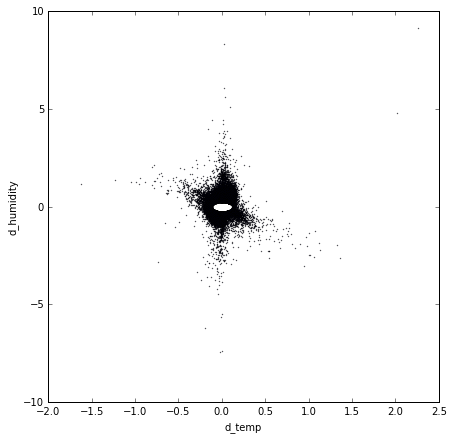

In [27]:
# plot
plot_cluster(gmm1,1,plot_all=False)

In [145]:
# der_ht_plot = np.zeros((d_ht_array.shape[0]-1,d_ht_array.shape[1]+1))
# der_ht_plot[:,:-1] = d_ht_array[1:,:]
# der_ht_plot[:,-1] = C

In [146]:
# cn=2
# fig = plt.figure(figsize=(7,7))
# # plt.scatter(der_ht_plot[:,0],der_ht_plot[:,1],c=der_ht_plot[:,2],s=10)
# plt.scatter(der_ht_plot[:,0][der_ht_plot[:,2]==cn],der_ht_plot[:,1][der_ht_plot[:,2]==cn],s=.1)
# plt.xlabel('change in temp')
# plt.ylabel('change in humdity');
# fig = plt.figure(figsize=(15,5))
# plt.plot(der_ht_plot[:,1][der_ht_plot[:,2]==cn])
# plt.xlabel('change in humidity')
# plt.title('change in humidity for cluster {}'.format(cn));

Next steps:
- PCA on features (before clustering)
- Time series on hour of day instead of day
- train/test data on clustering and time series

unsupervised cluster:

K-means

GMM

label based on cluster?

temp and humidity

time series composed of 24 time series ( for each day)
* recursive models
* optimal re-sampling
* paper topic - unclassified comparing approaches

In [100]:
# fig = pl.figure(figsize=(15,15))
# # df0 = df_norm[df_norm.km2==1]
# # df_cut = df_norm[:10000]
# pl.scatter(df_norm['temp'],df_norm['humidity'],c=df_norm['g2'],s=50,cmap=pl.cm.Spectral)
# # pl.scatter(df0['temp'],df0['humidity'],cmap=pl.cm.Spectral,s=.1)
# # pl.scatter(df_cut['temp'],df_cut['humidity'],c=colors,s=.5)
# pl.xlabel('temp')
# pl.ylabel('humidity');

In [101]:
# fig = plt.figure(figsize=(15,5))
# df0 = df_norm[df_norm.g2==0]
# plt.plot(df0['temp'],'.',label='T')
# plt.plot(df0['humidity'],'.',label='H')
# plt.legend(loc=2);

In [102]:
# date x time x features

In [103]:
# ts = df_norm.set_index('datetime').copy()

In [104]:
# ts = df_norm.groupby(['date','hour','minute']).mean()

In [105]:
# df_norm.date[0]

In [106]:
# new = df_norm.groupby('date').get_group(dt.date(2016, 8, 11)).groupby(['hour','minute']).mean()

In [107]:
# new_t = new.temp
# new_h = new.humidity
# new_ht = new.h_t
# # new.plot(new.index);
# # new_t.plot();
# # new_h.plot();
# new_ht.plot();

In [28]:
# group by day to get separate daily time series
ts_dict = {}
for i in df_norm.date.unique():
    ts_dict[i] = df_norm.groupby('date').get_group(i).groupby(['hour','minute']).mean()

In [29]:
# group by day to get separate daily time series
ts_h_dict = {}
for i in df_norm.day_hour.unique():
    ts_h_dict[i] = df_norm.groupby('day_hour').get_group(i).groupby(['minute']).mean()

In [30]:
# plot days and features
def plot_day(m,d,plot):
    day = ts_dict[dt.date(2016, m, d)]
    day_feature = day[plot]
    day_feature.plot()

In [31]:
# plot_day(8,11,'temp')
# plot_day(8,12,'temp')
# plot_day(8,13,'temp')

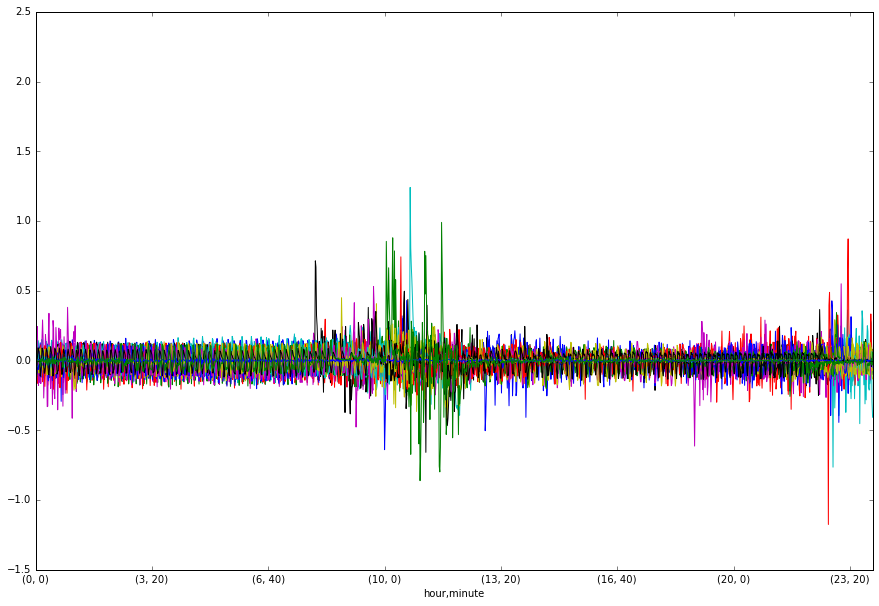

In [34]:
fig = plt.figure(figsize=(15,10))
for k,v in ts_dict.items():
    v['d_temp'].plot()

In [31]:
# # get dimensions for data matrix: days x minutes with data
# num_days = 0
# max_len = 0
# for k,v in ts_dict.items():
#     num_days+=1
#     if len(v)>max_len:
#         max_len=len(v)
# print num_days,max_len

In [32]:
# # make array - temp and humidity
# d_ht = np.zeros((40,1440))
# for i,k in enumerate(ts_dict):
#     for j in ts_dict[k]:
#         d_ht[i,j]
        
        
#         d_ht[i] = np.asarray([df_norm.temp,df_norm.humidity,df_norm.h_t]).T

# # random seed
# np.random.seed(32)

In [35]:
# create pandas panel with day X minute X feature
dp = pd.Panel(ts_dict)
#fill missing with zeros ----> NOTE THE CHOICE TO IMPUTE ZEROS FOR MISSING DATA
# and convert to 40 X 1440 X 4 matrix (day x minute x feature=(temp,pressure,humidity,h-t)
d_ht = np.asarray(dp.fillna(0).values)

In [36]:
# create pandas panel with hours X minutes X features
dphr = pd.Panel(ts_h_dict)
#fill missing with zeros ----> NOTE THE CHOICE TO IMPUTE ZEROS FOR MISSING DATA
# and convert to 993 hours X 60 minutes X 11 matrix (feature=(temp,pressure,humidity,h-t,derivative of temp...etc)
dhr_ht = np.asarray(dphr.fillna(0).values)

In [178]:
print ('Axis 2: total features:\n{}'.format(dphr.axes[2]))

Axis 2: total features:
Index([u'temp', u'pressure', u'humidity', u'hour', u'd_temp', u'd_humidity',
       u'd_pressure', u'd2_temp', u'd2_humidity', u'd2_pressure', u'h_t'],
      dtype='object')


In [37]:
# WITH TIME SERIES AS 24-HOUR PERIODS (i.e. daily cycle)
# create df for results
# df_results = pd.DataFrame(dp.axes[0].values)

# arrays for clustering
ht_array = d_ht[:,:,-1]
ht_results = pd.DataFrame(ht_array,index=dp.axes[0])

t_array = d_ht[:,:,0]
t_results = pd.DataFrame(t_array,index=dp.axes[0])

dt_array = d_ht[:,:,3]
dt_results = pd.DataFrame(dt_array,index=dp.axes[0])

In [38]:
# WITH TIME SERIES AS 1-HOUR PERIODS (i.e. hourly cycle)

# arrays for clustering
# humidity-temp
ht_array_hour = dhr_ht[:,:,-1]
ht_results_hour = pd.DataFrame(ht_array_hour,index=dphr.axes[0])

# temp
t_array_hour = dhr_ht[:,:,0]
t_results_hour = pd.DataFrame(t_array_hour,index=dphr.axes[0])

# change in temp
dt_array_hour = dhr_ht[:,:,4]
dt_results_hour = pd.DataFrame(dt_array_hour,index=dphr.axes[0])

In [39]:
# WITH TIME SERIES AS 24-HOUR PERIODS (i.e. daily cycle)


# random seed
np.random.seed(32)

# kmeans
km2 = KMeans(n_clusters=2)
ht_results['km2'] = km2.fit_predict(ht_array)
clusters = pd.DataFrame(index=dp.axes[0],columns=['ht_km2'])
clusters['ht_km2'] = km2.fit_predict(ht_array)

#temp
t_results['km2'] = km2.fit_predict(t_array)
clusters['t_km2'] = t_results['km2']

#temp 1st der
dt_results['km2'] = km2.fit_predict(dt_array)
clusters['dt_km2'] = dt_results['km2']

In [40]:
# WITH TIME SERIES AS 1-HOUR PERIODS (i.e. hourly cycle)


# random seed
np.random.seed(32)

# kmeans
km2 = KMeans(n_clusters=2)
ht_results_hour['km2'] = km2.fit_predict(ht_array_hour)
clusters_hour = pd.DataFrame(index=dphr.axes[0],columns=['ht_km2'])
clusters_hour['ht_km2'] = km2.fit_predict(ht_array_hour)

#temp
t_results_hour['km2'] = km2.fit_predict(t_array_hour)
clusters_hour['t_km2'] = t_results_hour['km2']

#temp 1st der
dt_results_hour['km2'] = km2.fit_predict(dt_array_hour)
clusters_hour['dt_km2'] = dt_results_hour['km2']

In [41]:
# WITH TIME SERIES AS 24-HOUR PERIODS (i.e. daily cycle)

# kmeans 5
km5 = KMeans(n_clusters=5)
ht_results['km5'] = km5.fit_predict(ht_array)
clusters['ht_km5'] = ht_results['km5']

#temp
t_results['km5'] = km5.fit_predict(t_array)
clusters['t_km5'] = t_results['km5']

#temp 1st der
dt_results['km5'] = km5.fit_predict(dt_array)
clusters['dt_km5'] = dt_results['km5']

In [42]:
# WITH TIME SERIES AS 1-HOUR PERIODS (i.e. hourly cycle)

# kmeans 5
km5 = KMeans(n_clusters=5)
ht_results_hour['km5'] = km5.fit_predict(ht_array_hour)
clusters_hour['ht_km5'] = ht_results_hour['km5']

#temp
t_results_hour['km5'] = km5.fit_predict(t_array_hour)
clusters_hour['t_km5'] = t_results_hour['km5']

#temp 1st der
dt_results_hour['km5'] = km5.fit_predict(dt_array_hour)
clusters_hour['dt_km5'] = dt_results_hour['km5']

In [43]:
# # dbscan
# db = DBSCAN(min_samples=5)
# df_results['db'] = db.fit_predict(ht_array)

In [44]:
# WITH TIME SERIES AS 24-HOUR PERIODS (i.e. daily cycle)


# GMM
g = GMM(n_components=3)
g.fit(ht_array)
ht_results['g3'] = g.predict(ht_array)
clusters['ht_g3'] = ht_results['g3']

# temp
g.fit(t_array)
t_results['g3'] = g.predict(t_array)
clusters['t_g3'] = t_results['g3']

# temp 1st def
g.fit(dt_array)
dt_results['g3'] = g.predict(dt_array)
clusters['dt_g3'] = dt_results['g3']

In [45]:
# WITH TIME SERIES AS 1-HOUR PERIODS (i.e. hourly cycle)


# GMM
g = GMM(n_components=3)
g.fit(ht_array_hour)
ht_results_hour['g3'] = g.predict(ht_array_hour)
clusters_hour['ht_g3'] = ht_results_hour['g3']

# temp
g.fit(t_array_hour)
t_results_hour['g3'] = g.predict(t_array_hour)
clusters_hour['t_g3'] = t_results_hour['g3']

# temp 1st def
g.fit(dt_array_hour)
dt_results_hour['g3'] = g.predict(dt_array_hour)
clusters_hour['dt_g3'] = dt_results_hour['g3']

In [46]:
# WITH TIME SERIES AS 24-HOUR PERIODS (i.e. hourly cycle)


# GMM=5
g5 = GMM(n_components=5)
g5.fit(ht_array)
ht_results['g5'] = g5.predict(ht_array)
clusters['ht_g5'] = ht_results['g5']

# temp
g5.fit(t_array)
t_results['g5'] = g5.predict(t_array)
clusters['t_g5'] = t_results['g5']

# temp 1st der
g5.fit(dt_array)
dt_results['g5'] = g5.predict(dt_array)
clusters['dt_g5'] = dt_results['g5']

In [47]:
# WITH TIME SERIES AS 1-HOUR PERIODS (i.e. hourly cycle)


# GMM=5
g5 = GMM(n_components=5)
g5.fit(ht_array_hour)
ht_results_hour['g5'] = g5.predict(ht_array_hour)
clusters_hour['ht_g5'] = ht_results_hour['g5']

# temp
g5.fit(t_array_hour)
t_results_hour['g5'] = g5.predict(t_array_hour)
clusters_hour['t_g5'] = t_results_hour['g5']

# temp 1st der
g5.fit(dt_array_hour)
dt_results_hour['g5'] = g5.predict(dt_array_hour)
clusters_hour['dt_g5'] = dt_results_hour['g5']

In [48]:
# LONG RUNTIME***********
# # WITH TIME SERIES AS 24-HOUR PERIODS (i.e. daily cycle)

# # MeanShift
# ms = MeanShift()
# ht_results['ms'] = ms.fit_predict(ht_array)
# clusters['ht_ms'] = ht_results['ms']

# # temp
# t_results['ms'] = ms.fit_predict(t_array)
# clusters['t_ms'] = t_results['ms']

# # temp 1st der
# dt_results['ms'] = ms.fit_predict(dt_array)
# clusters['dt_ms'] = dt_results['ms']

In [49]:
# fig = plt.figure(figsize=(15,3))
# ax = []

# def plot_cluster(data,method,title):
#     for i in range(0,max(data[method])):
#         ax.append(plt.subplot2grid((15,3), (i), 1))
#         cluster_num=i
#         fig = plt.figure(figsize=(15,3))
#         temp = data[data[method]==cluster_num].drop(['km2','g3','km5','g5','ms'],1).T
#         plt.plot(temp,color='gray',alpha=0.3)
#     plt.xlabel('daily cycle in minutes')
#     plt.ylabel('cov. (based on norm scale of obs. data)')
#     plt.title('{},{}'.format(title,method));

In [50]:
def plot_cluster(data,method,title):
    for i in range(0,max(data[method])+1):
        fig = plt.figure(figsize=(15,3))
#         temp = data[data[method]==i].drop(['km2','g3','km5','g5','ms'],1).T
        temp = data[data[method]==i].drop(['km2','g3','km5','g5'],1).T
        plt.plot(temp,color='gray',alpha=0.3);
        plt.xlabel('daily cycle in minutes')
        plt.ylabel('cov. (based on norm scale of obs. data)')
        plt.title('{},{},cluster={}'.format(title,method,i));

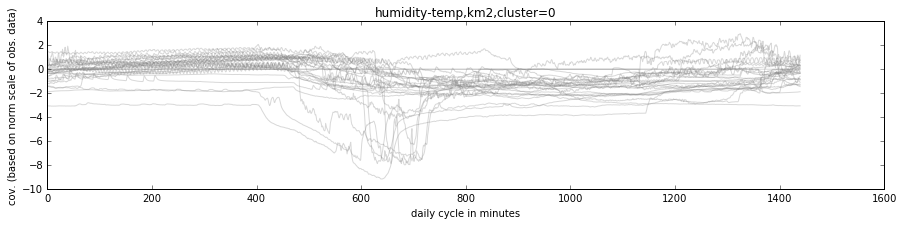

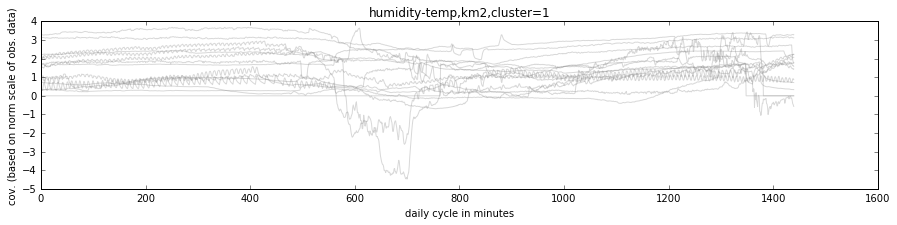

In [51]:
plot_cluster(ht_results,'km2','humidity-temp')

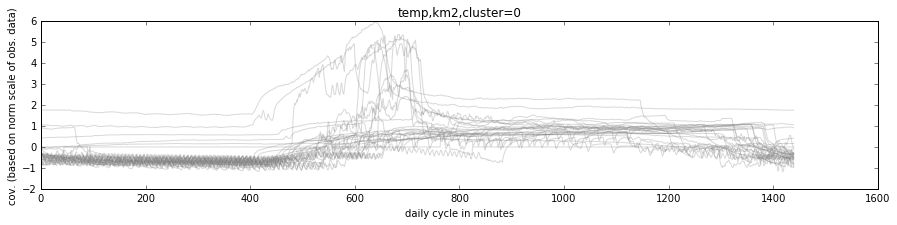

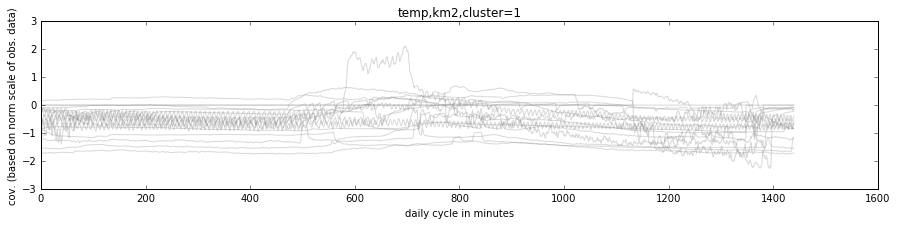

In [52]:
plot_cluster(t_results,'km2','temp')

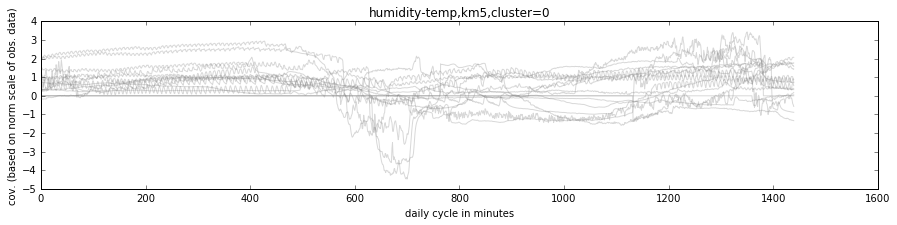

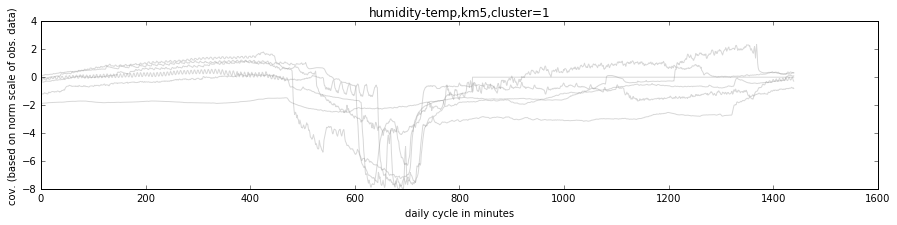

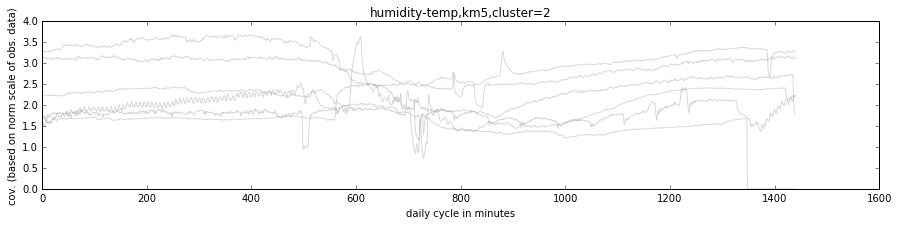

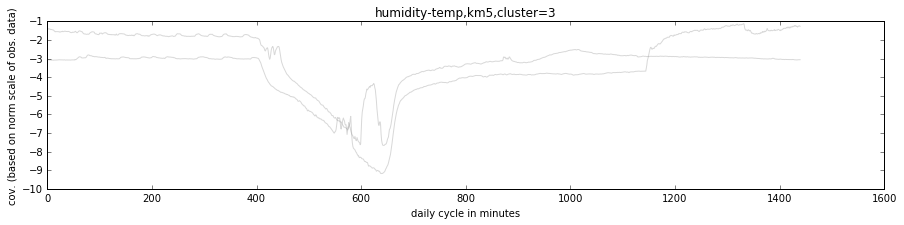

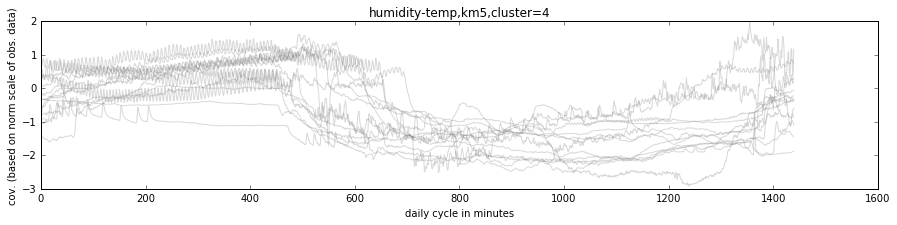

In [54]:
plot_cluster(ht_results,'km5','humidity-temp')

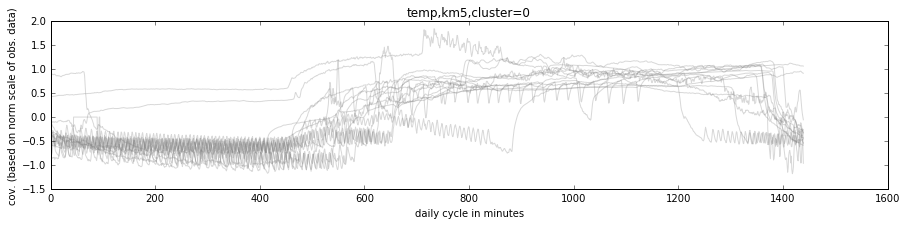

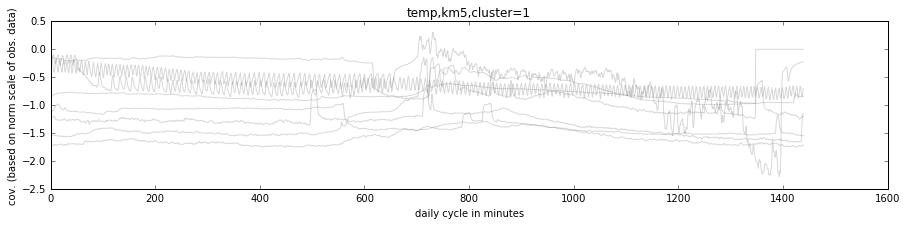

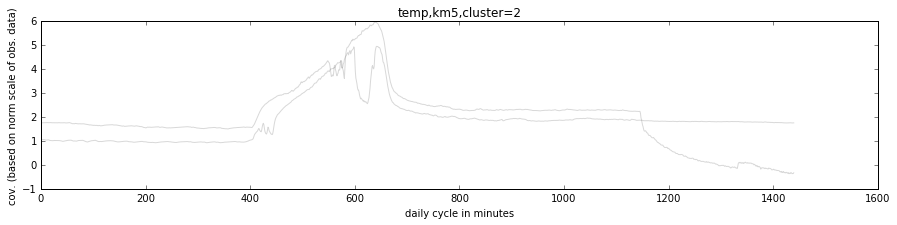

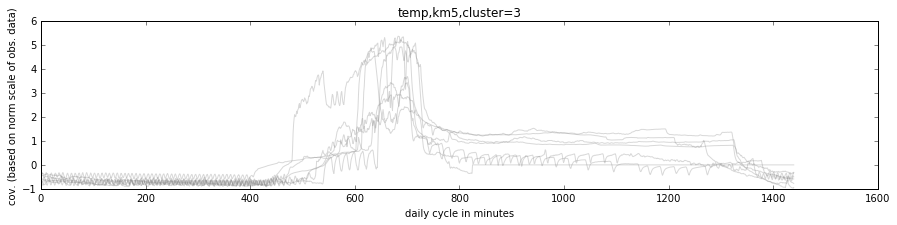

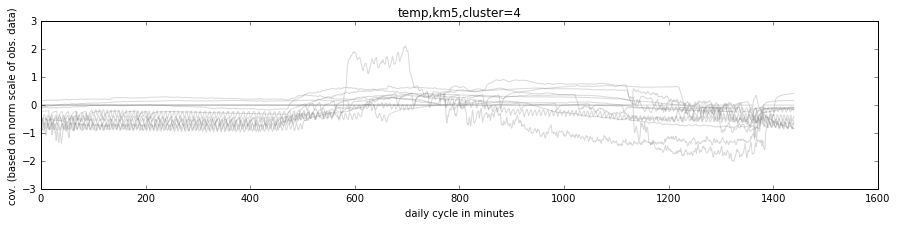

In [55]:
plot_cluster(t_results,'km5','temp')

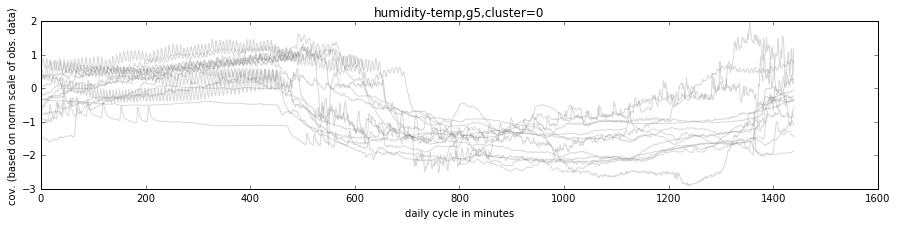

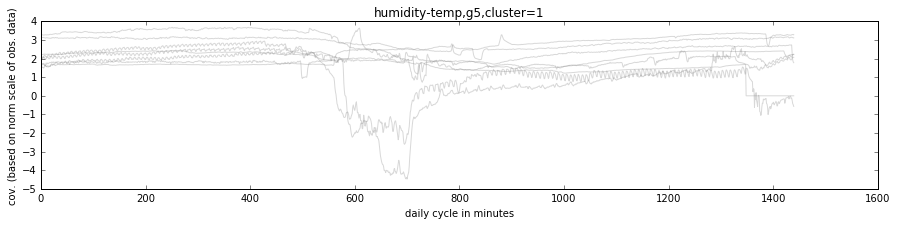

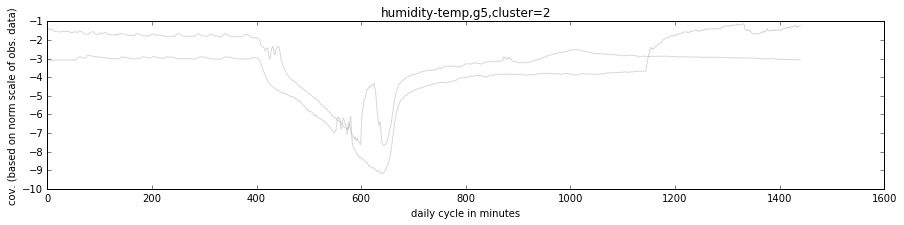

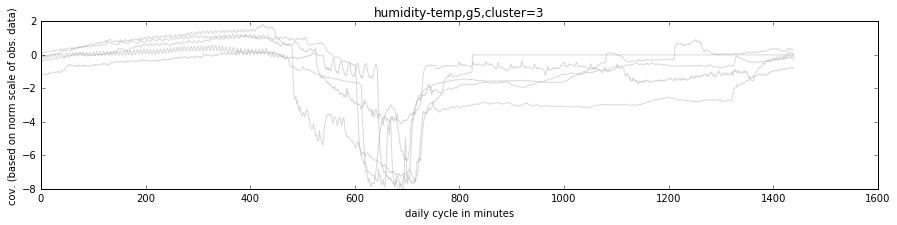

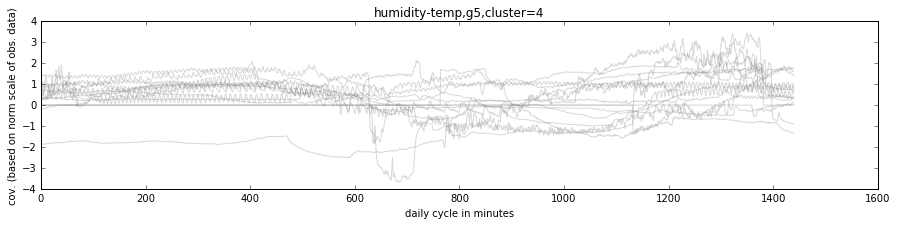

In [56]:
plot_cluster(ht_results,'g5','humidity-temp')

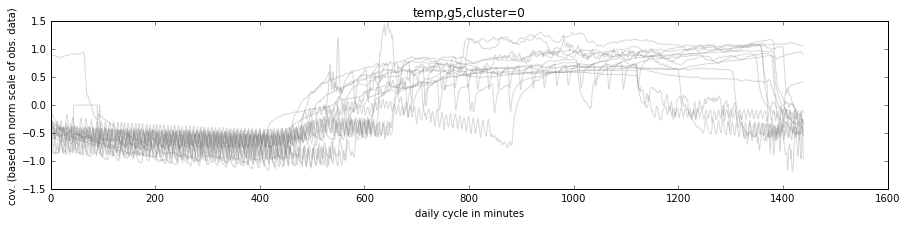

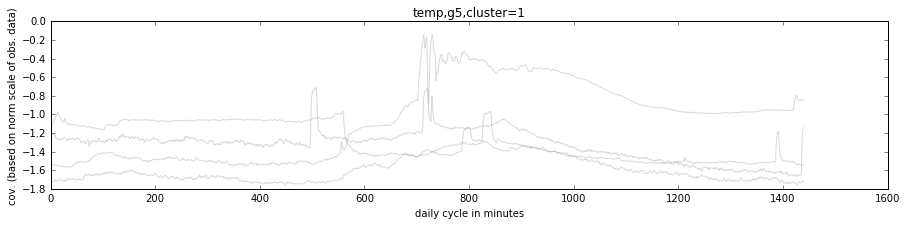

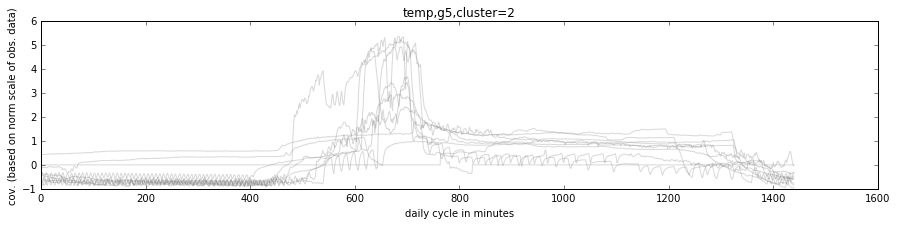

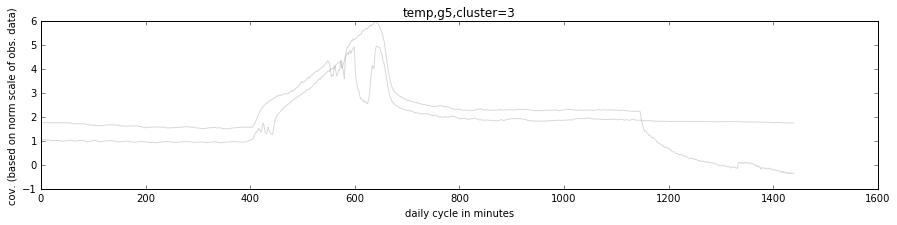

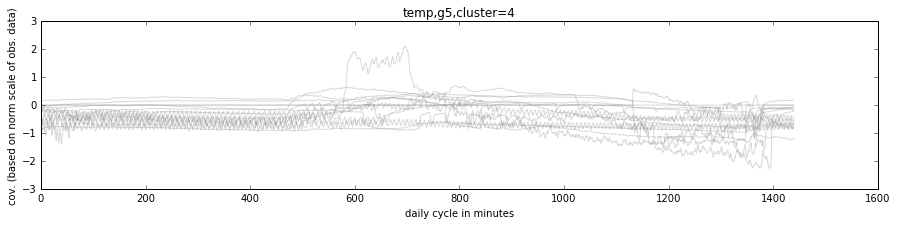

In [57]:
plot_cluster(t_results,'g5','temp')

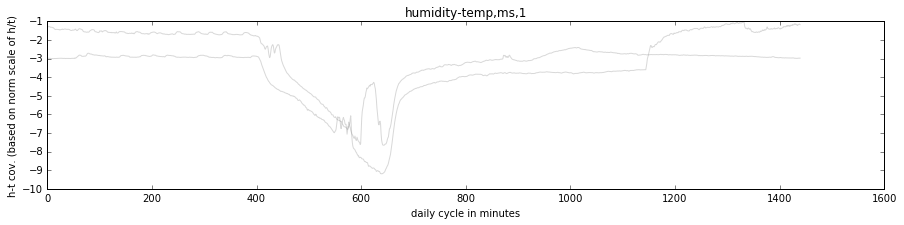

In [60]:
# *******
# EVERY CLUSTERING METHOD SEEMS TO HAVE ISOLATED THESE TWO DAYS...
# **************
plot_cluster(ht_results,'ms',1)

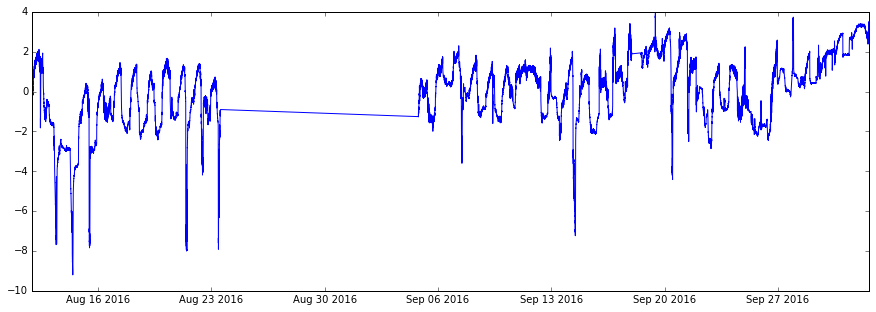

In [62]:
plt.figure(figsize=(15,5))
plt.plot(df_norm.datetime,df_norm.h_t);

In [71]:
# ht_results[ht_results.ms==1]
ht_results[ht_results.g5==1]

,0,1,2,3,4,5,6,7,8,9,...,1435,1436,1437,1438,1439,km2,km5,g3,g5,ms
2016-08-13,-1.230921,-1.248761,-1.285596,-1.290780,-1.281822,-1.284435,-1.312568,-1.321910,-1.311630,-1.318267,...,-2.978064,-2.974698,-2.977006,-2.976250,-2.975013,0,2,2,1,1
2016-08-14,-2.978557,-2.974031,-2.983077,-2.986634,-2.984282,-2.986703,-2.986780,-2.996347,-3.002697,-2.995614,...,-1.194500,-1.159002,-1.158897,-1.144106,-1.173654,0,2,2,1,1


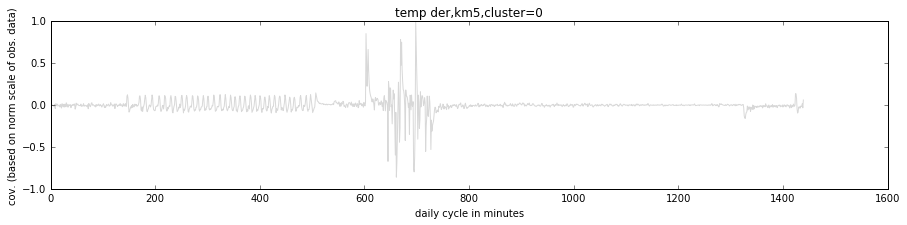

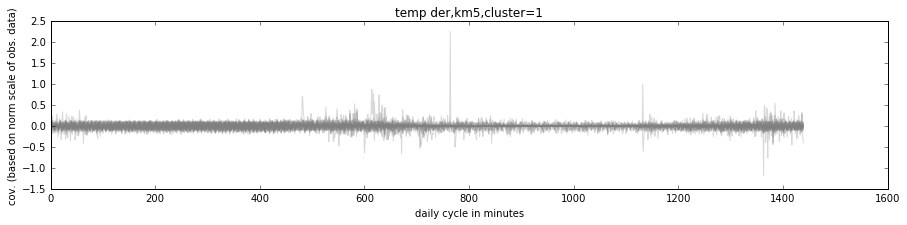

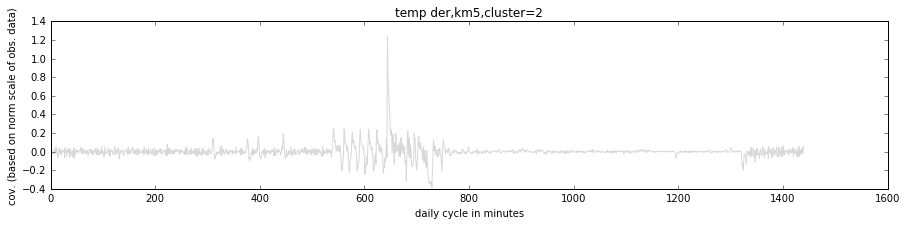

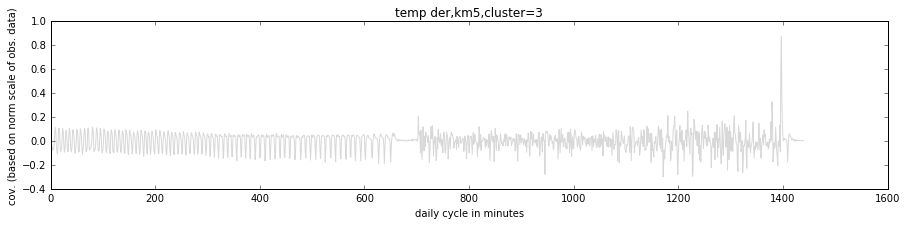

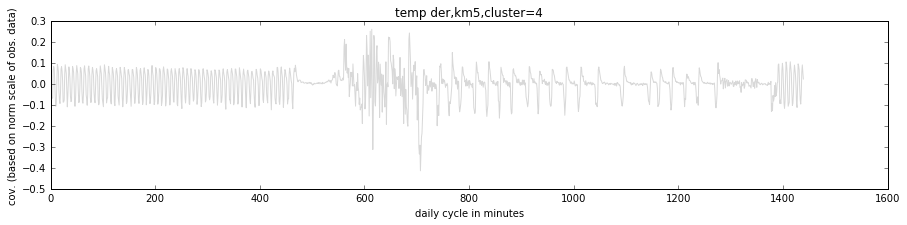

In [58]:
plot_cluster(dt_results,'km5','temp der')

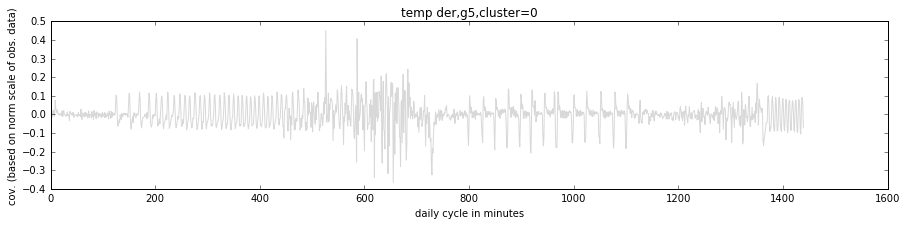

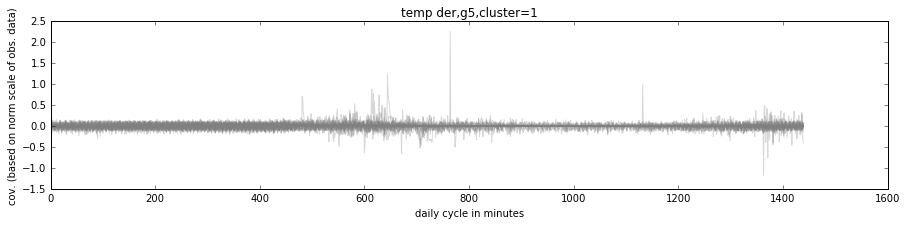

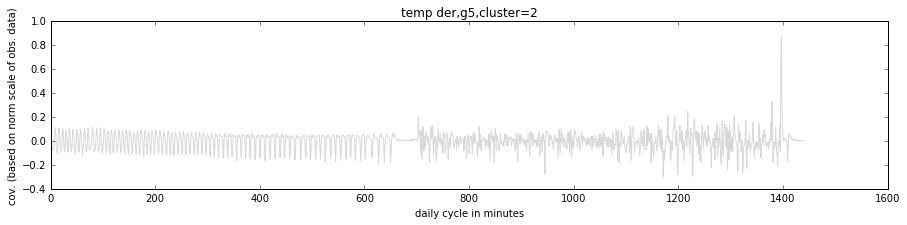

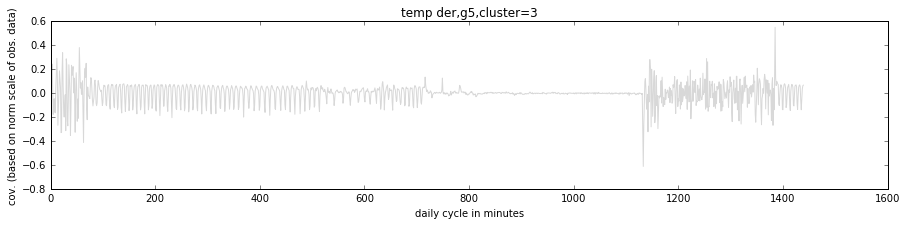

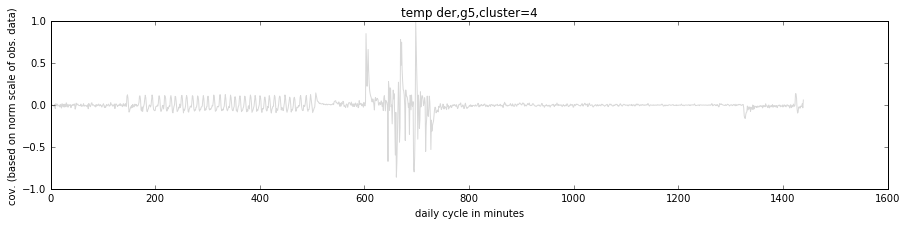

In [59]:
plot_cluster(dt_results,'g5','temp der')

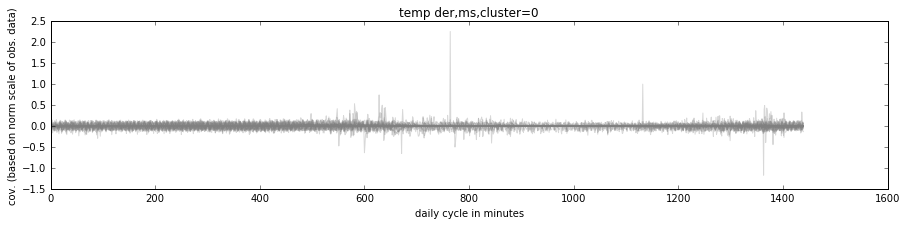

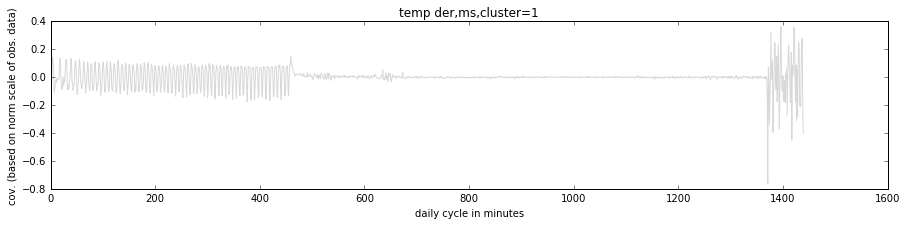

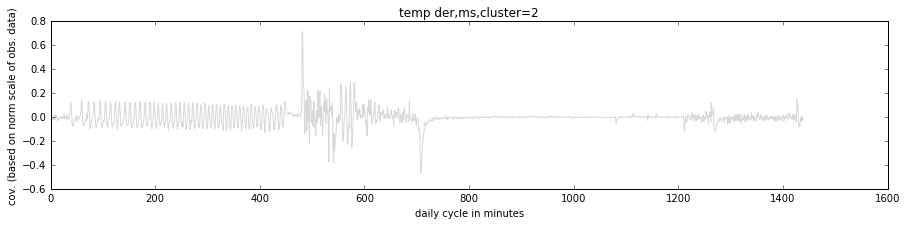

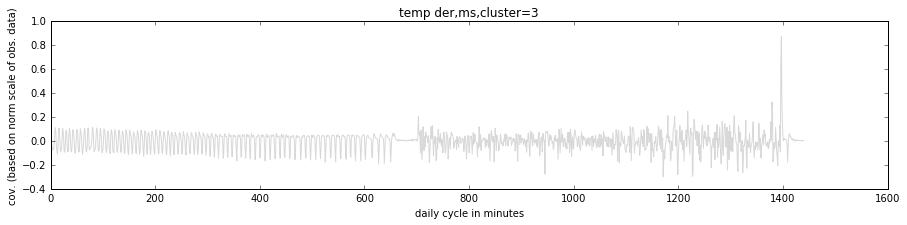

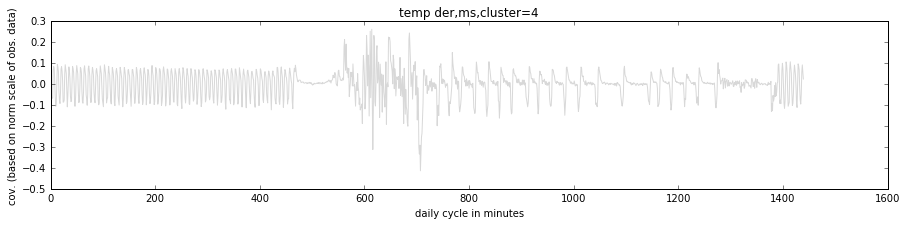

...

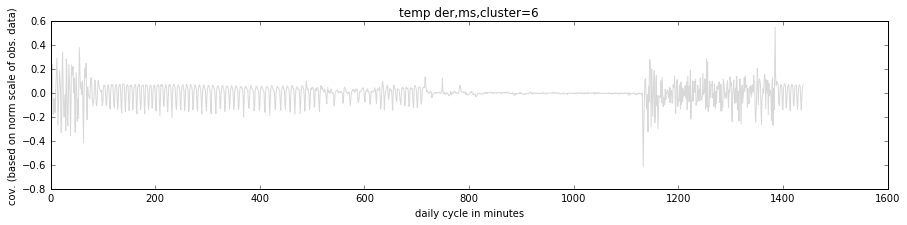

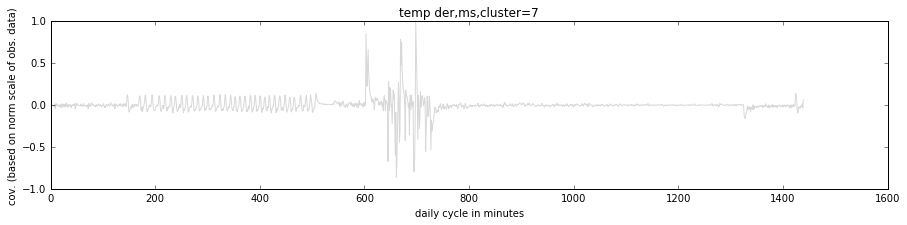

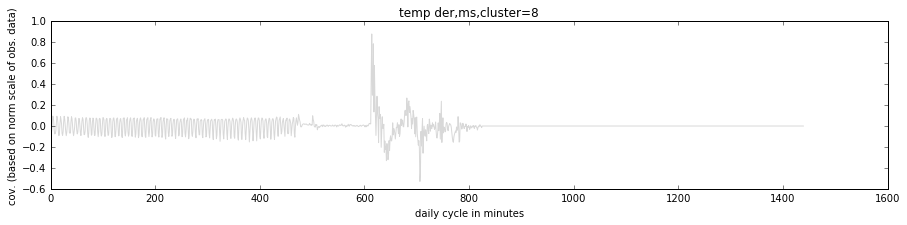

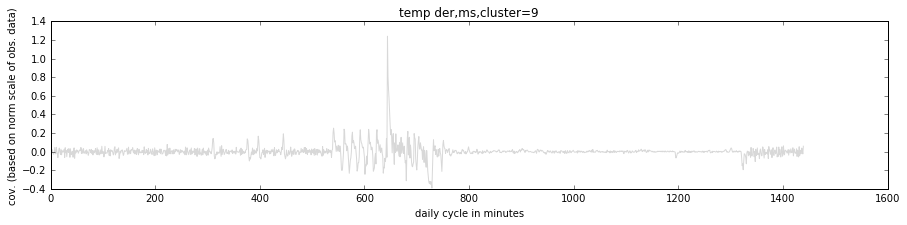

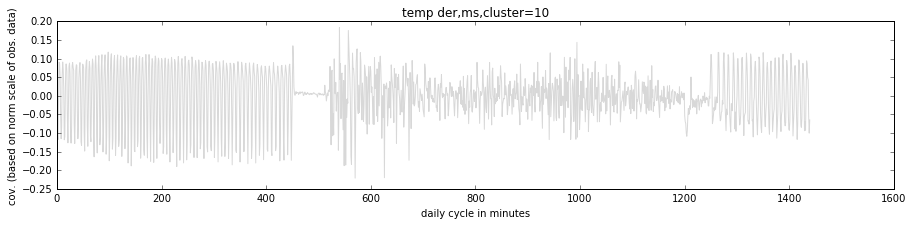

In [35]:
plot_cluster(dt_results,'ms','temp der')

## 1 hour cycle

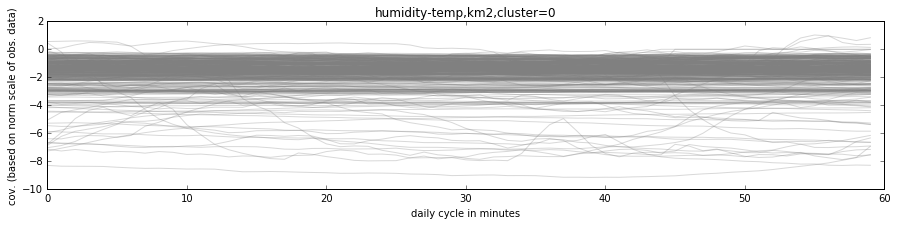

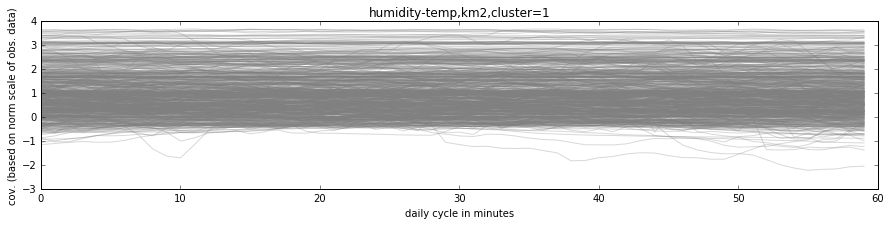

In [60]:
plot_cluster(ht_results_hour,'km2','humidity-temp')

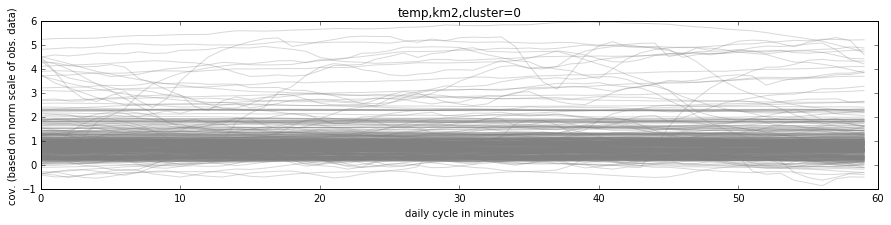

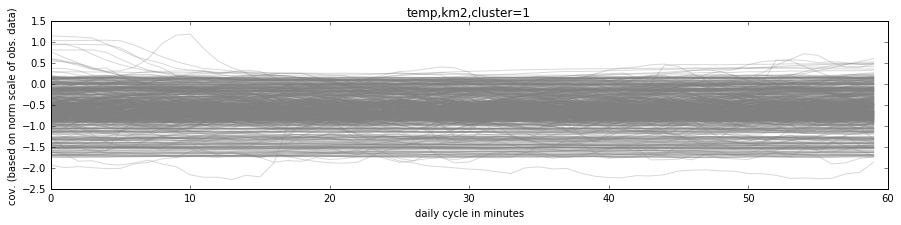

In [61]:
plot_cluster(t_results_hour,'km2','temp')

^^NIGHT AND DAY?^^

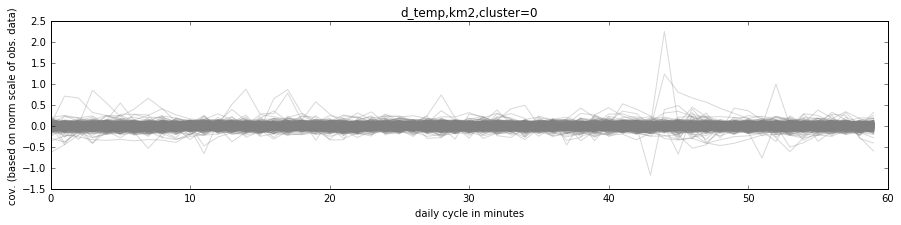

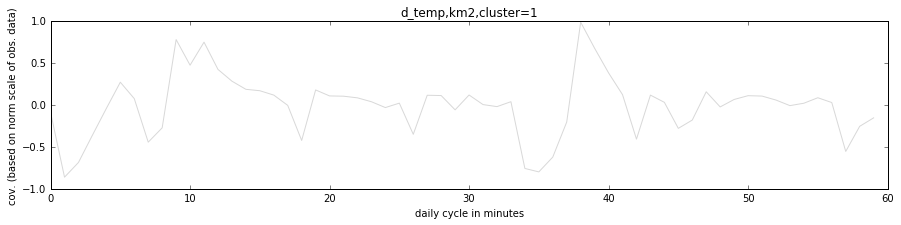

In [62]:
plot_cluster(dt_results_hour,'km2','d_temp')

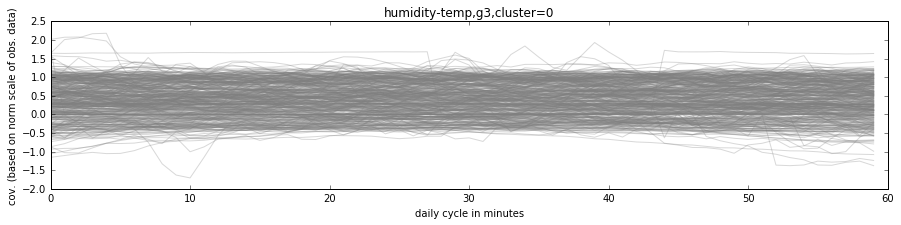

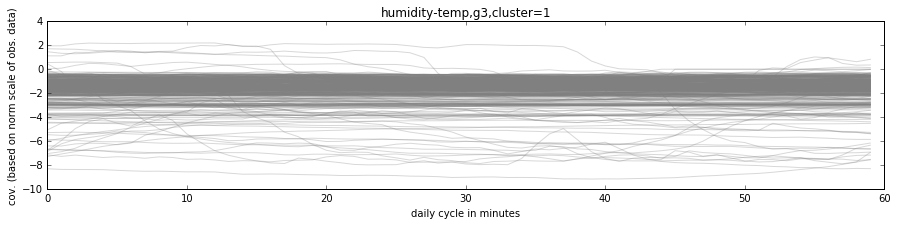

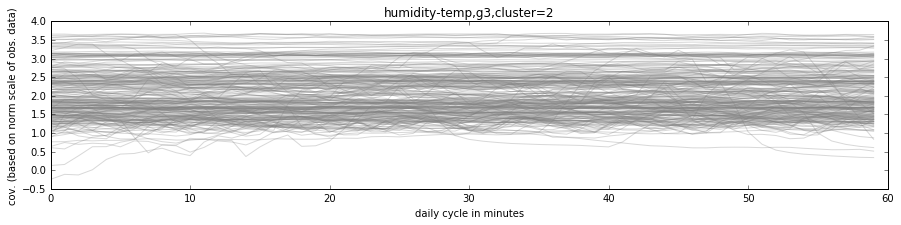

In [202]:
plot_cluster(ht_results_hour,'g3','humidity-temp')

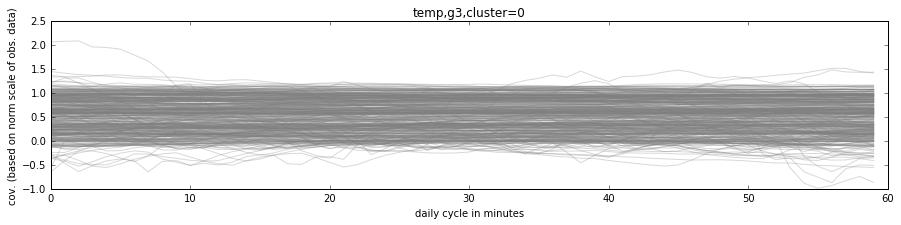

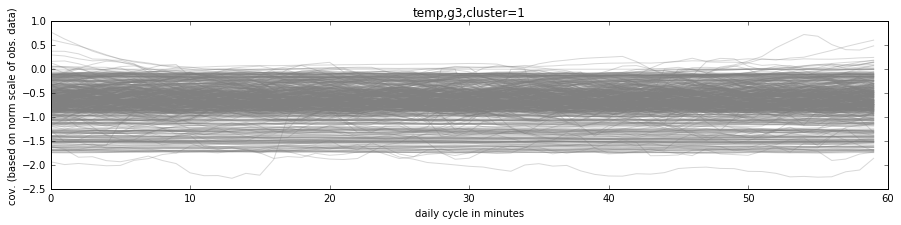

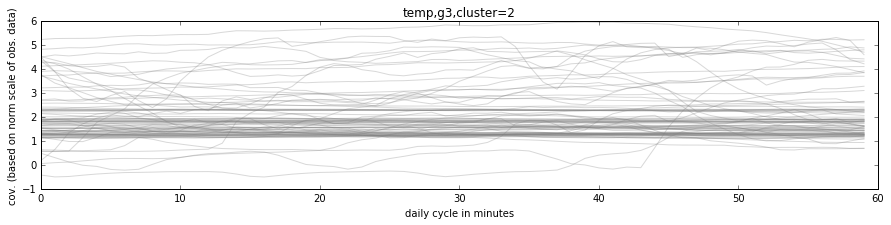

In [203]:
plot_cluster(t_results_hour,'g3','temp')

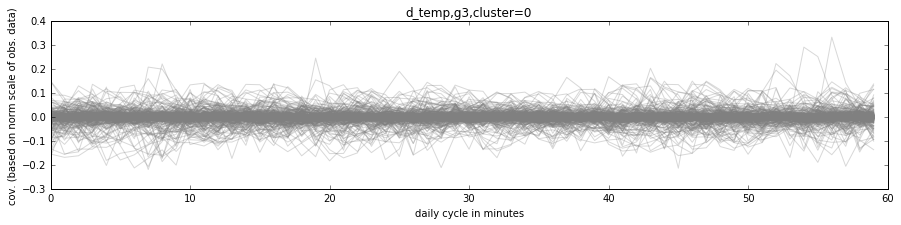

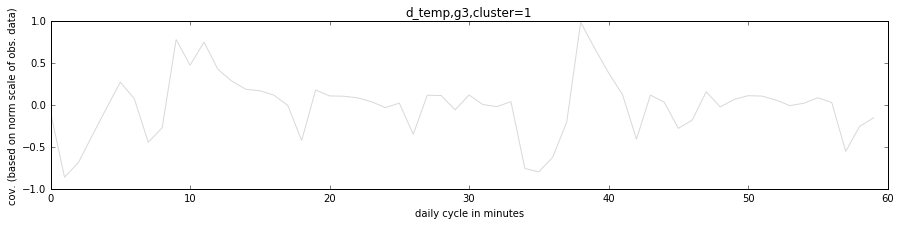

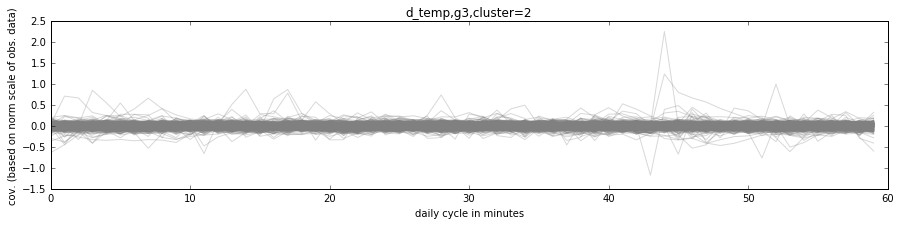

In [204]:
plot_cluster(dt_results_hour,'g3','d_temp')

In [63]:
# KMEANS 24 CLUSTER 1 HOUR CYCLE DATA

# kmeans
km24 = KMeans(n_clusters=24)
ht_results_hour['km24'] = km24.fit_predict(ht_array_hour)
clusters_hour['ht_km24'] = km24.fit_predict(ht_array_hour)

#temp
t_results_hour['km24'] = km24.fit_predict(t_array_hour)
clusters_hour['t_km24'] = t_results_hour['km24']

#temp 1st der
dt_results_hour['km24'] = km24.fit_predict(dt_array_hour)
clusters_hour['dt_km24'] = dt_results_hour['km24']

In [64]:
# GMM 24 COMPONENTS 1 HOUR CYCLE DATA

g24 = GMM(n_components=24)
g24.fit(ht_array_hour)
ht_results_hour['g24'] = g24.predict(ht_array_hour)
clusters_hour['ht_g24'] = ht_results_hour['g24']

# temp
g24.fit(t_array_hour)
t_results_hour['g24'] = g24.predict(t_array_hour)
clusters_hour['t_g24'] = t_results_hour['g24']

# temp 1st def
g24.fit(dt_array_hour)
dt_results_hour['g24'] = g24.predict(dt_array_hour)
clusters_hour['dt_g24'] = dt_results_hour['g24']

In [65]:
# 24 hour plot
def plot_cluster_24(data,method,title):
    for i in range(0,max(data[method])+1):
        fig = plt.figure(figsize=(15,3))
        temp = data[data[method]==i].drop(['km2','g3','km5','g5','km24','g24'],1).T
        plt.plot(temp,color='gray',alpha=0.3);
        plt.xlabel('daily cycle in minutes')
        plt.ylabel('cov. (based on norm scale of obs. data)')
        plt.title('{},{},cluster={}'.format(title,method,i));

/Users/Daynan/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


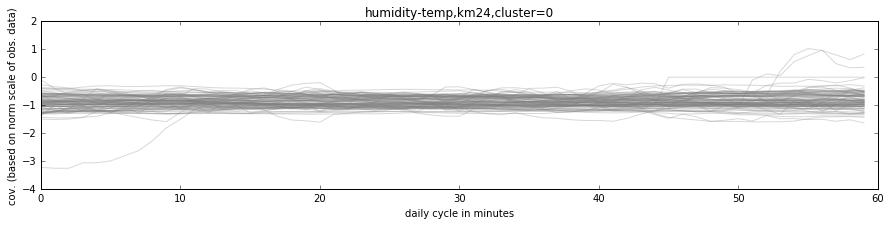

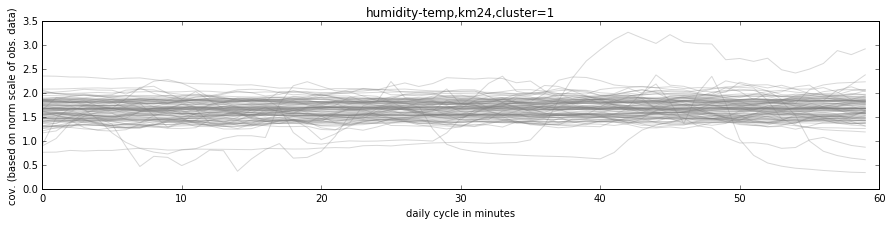

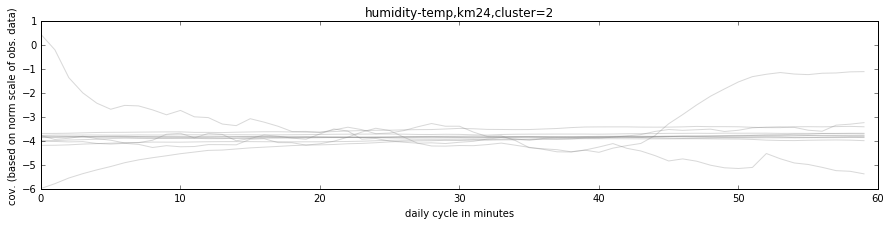

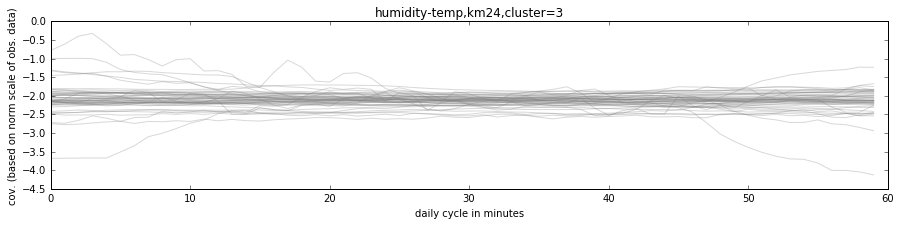

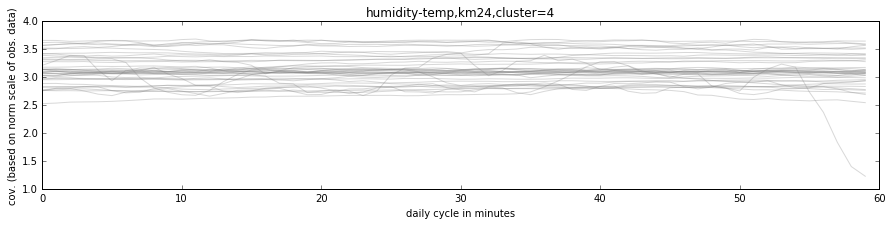

...

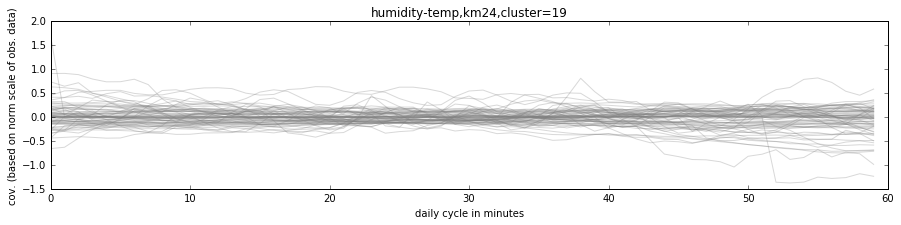

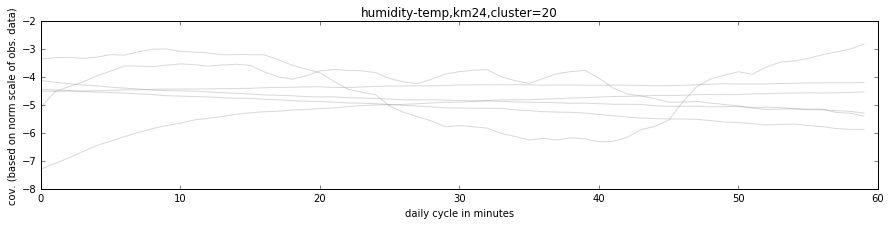

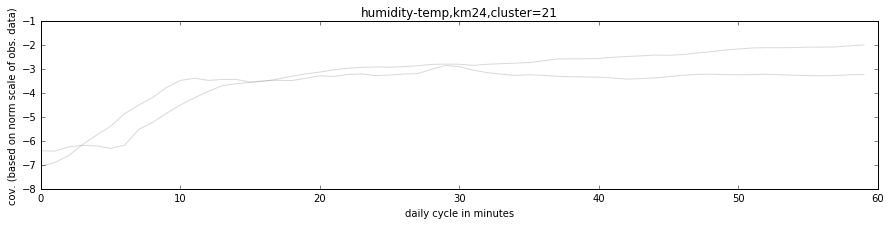

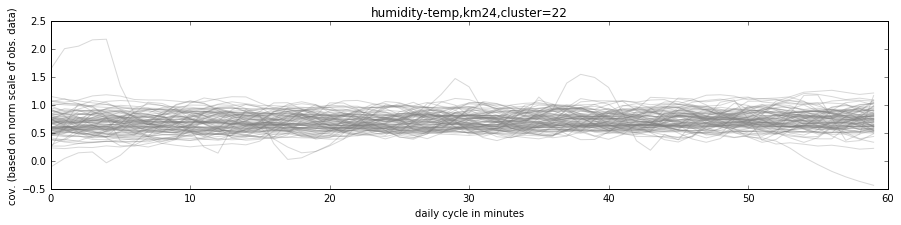

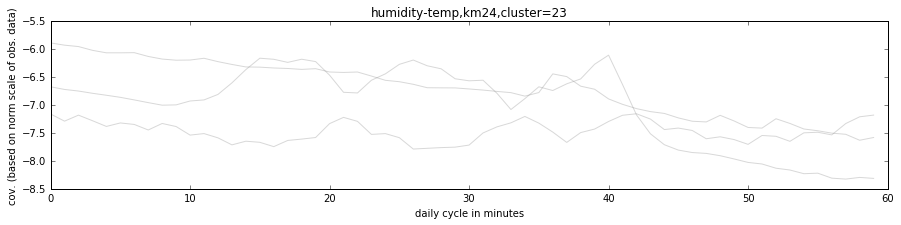

In [66]:
plot_cluster_24(ht_results_hour,'km24','humidity-temp')

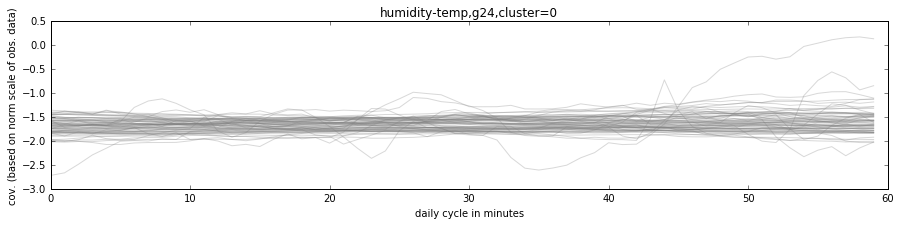

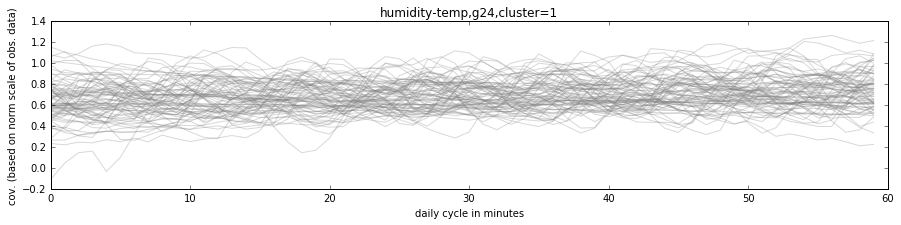

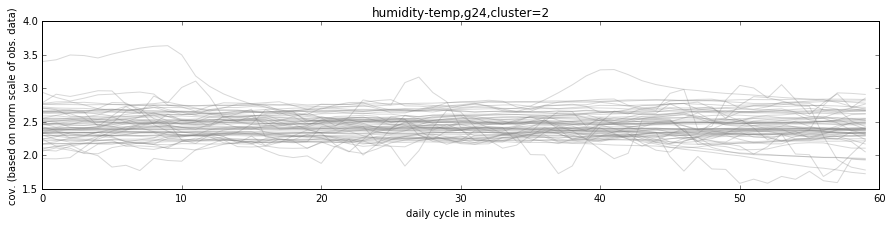

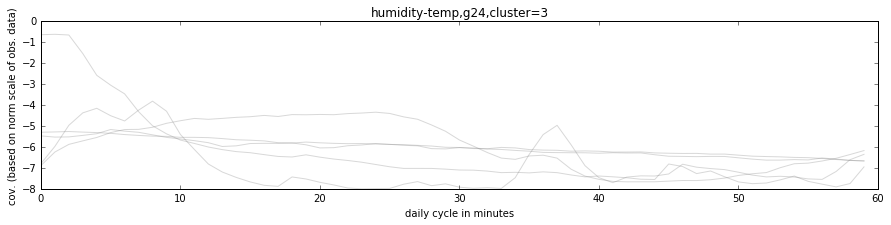

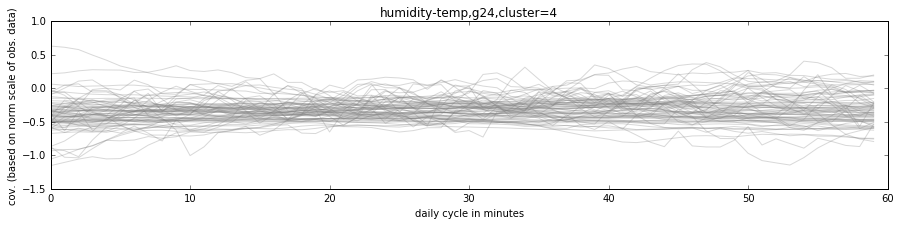

...

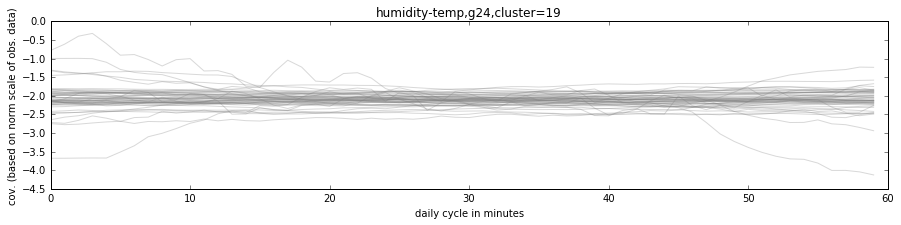

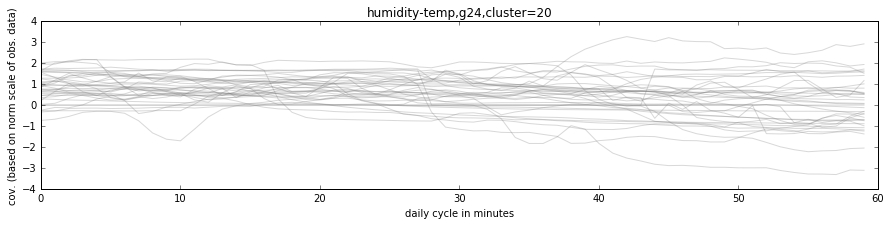

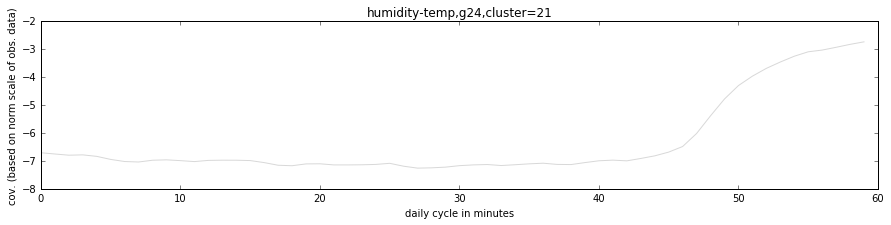

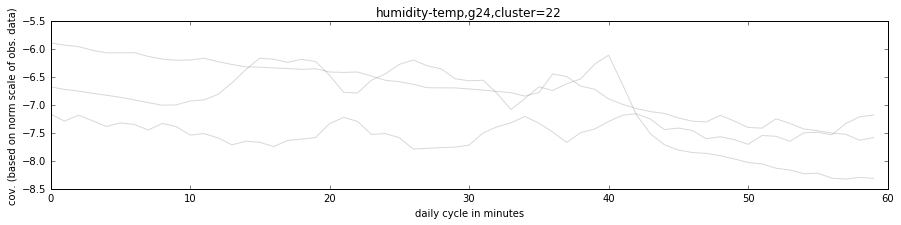

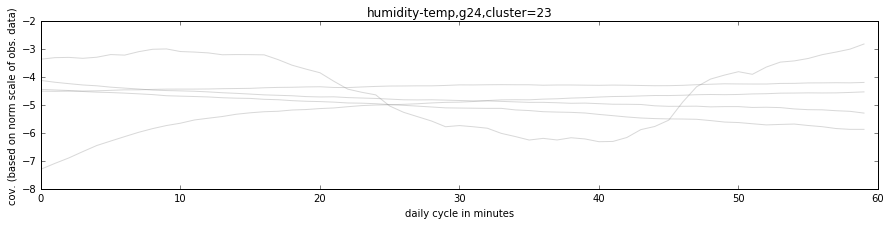

In [211]:
plot_cluster_24(ht_results_hour,'g24','humidity-temp')

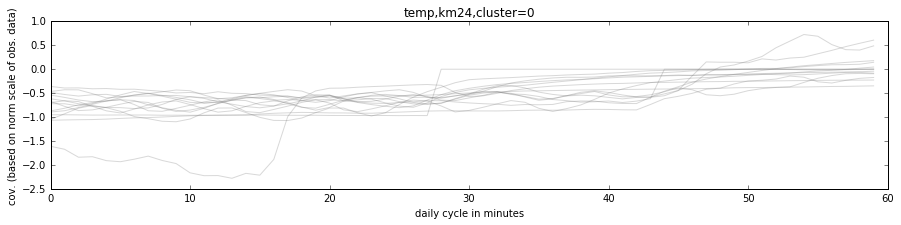

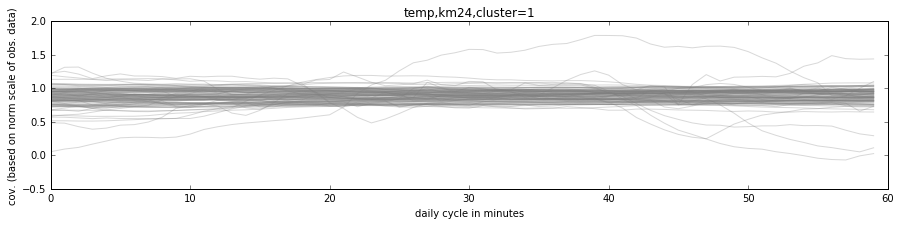

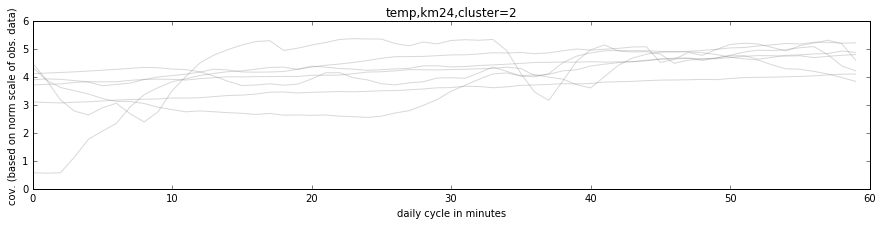

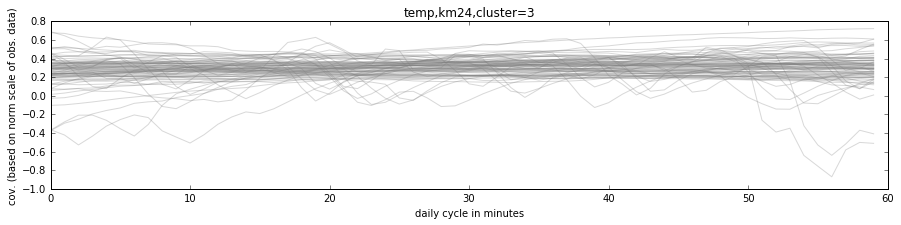

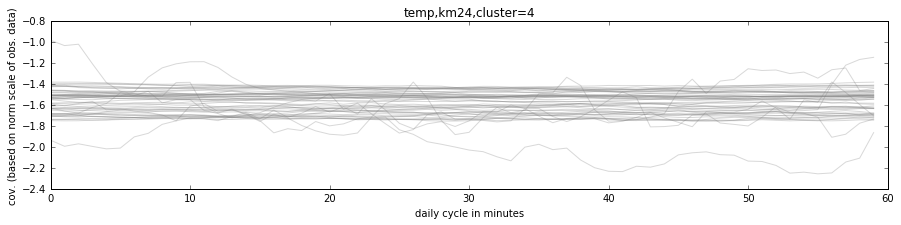

...

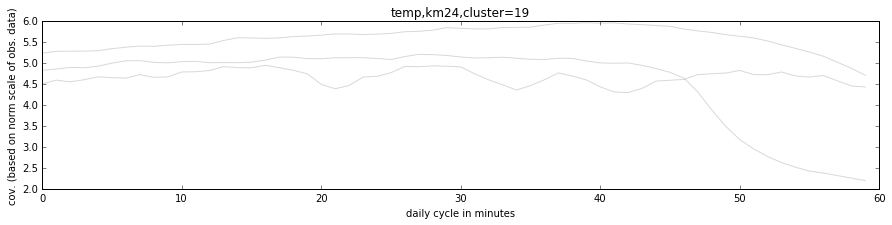

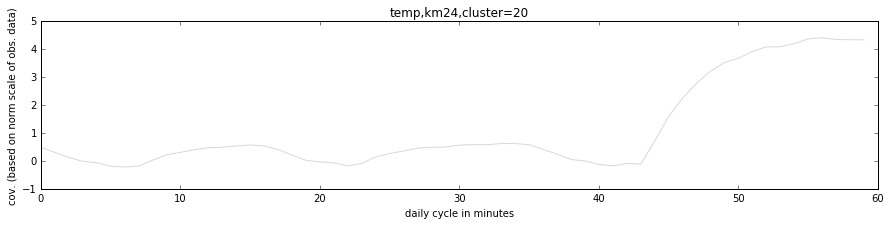

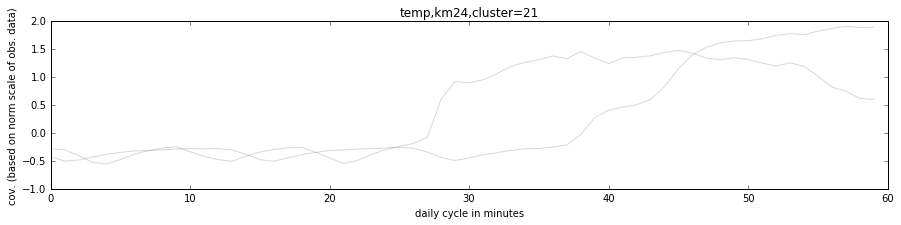

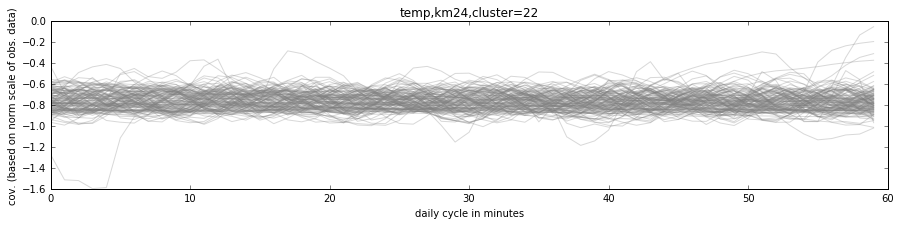

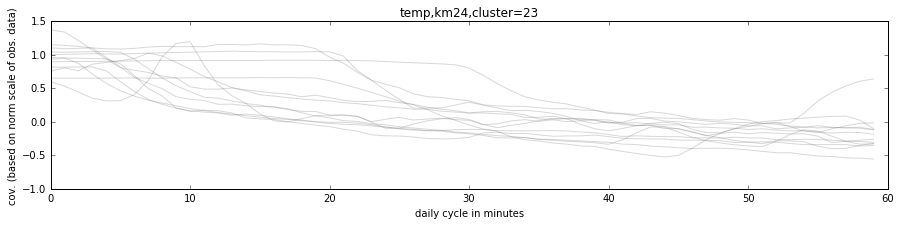

In [212]:
# CAN IDENTIFY AIR CONDITIONER (CLUSTER 15,16)
plot_cluster_24(t_results_hour,'km24','temp')

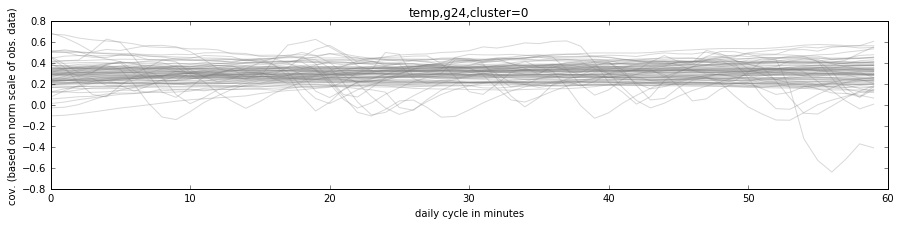

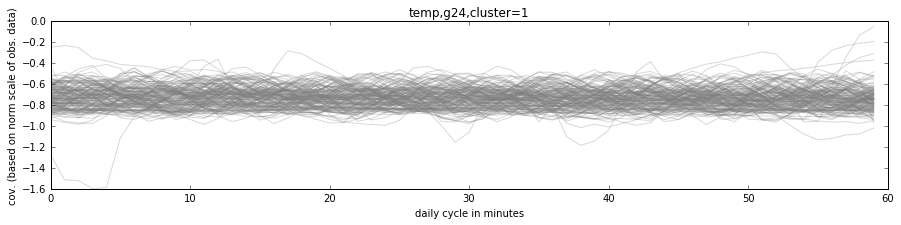

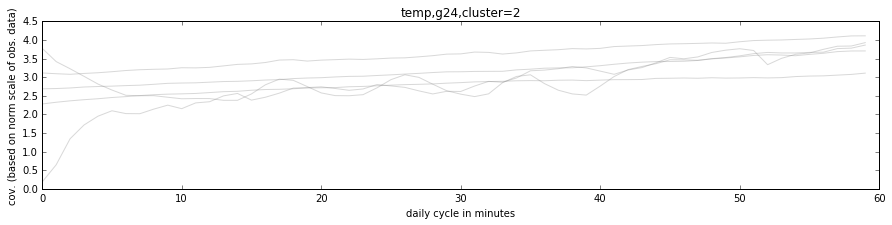

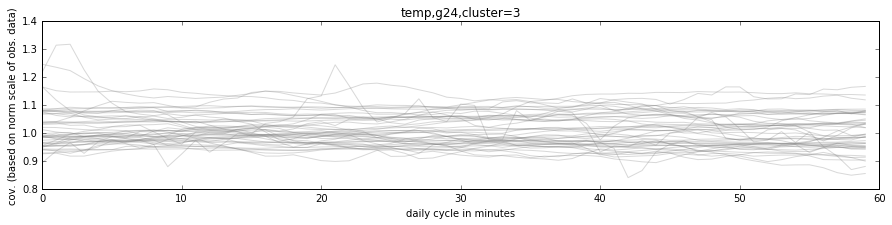

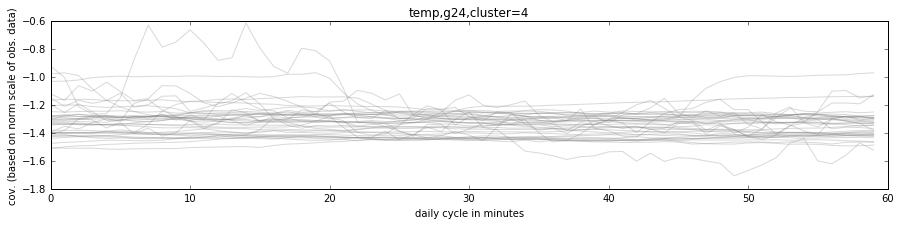

...

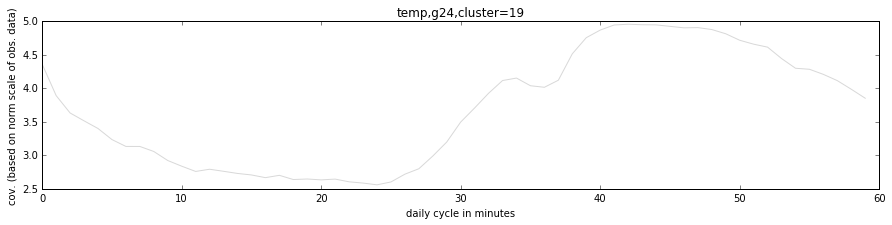

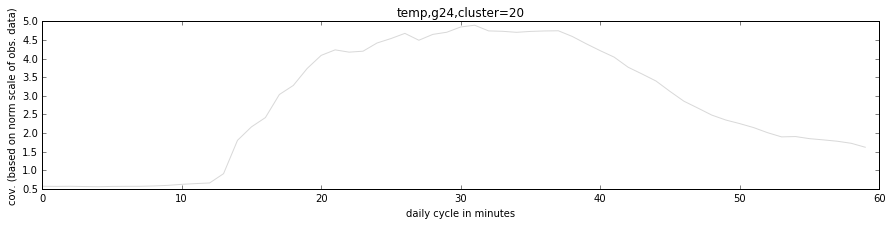

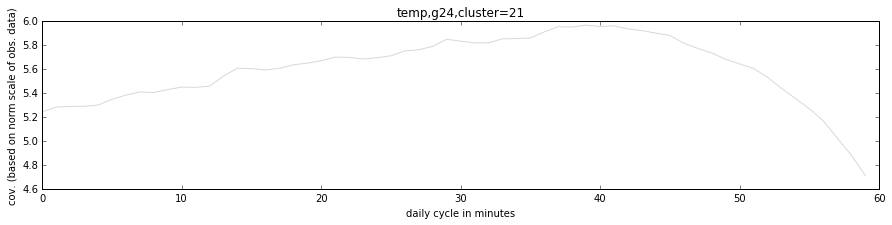

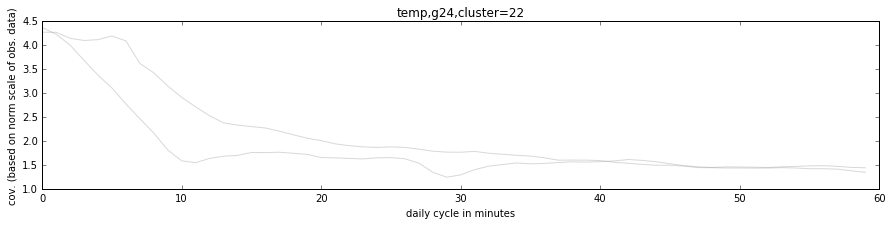

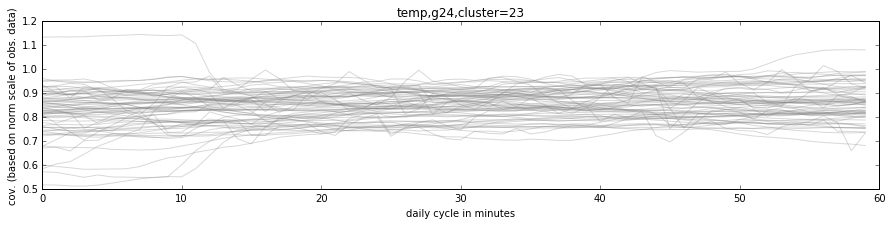

In [213]:
plot_cluster_24(t_results_hour,'g24','temp')

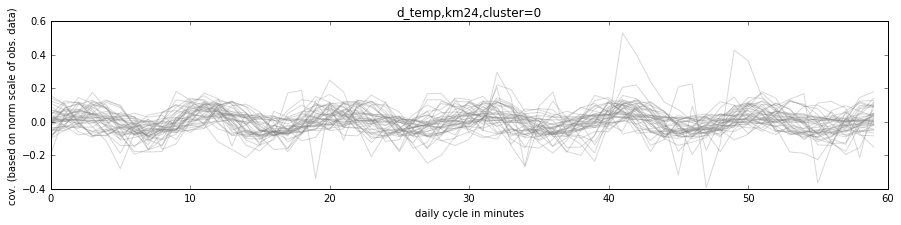

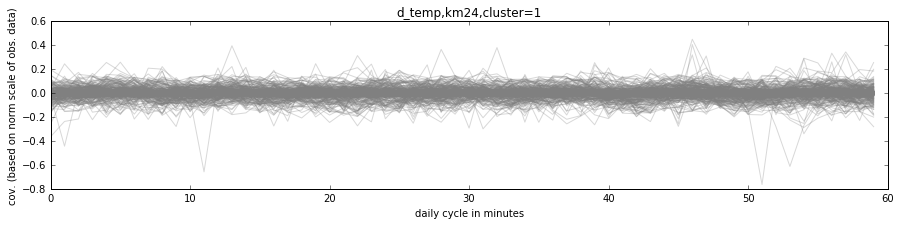

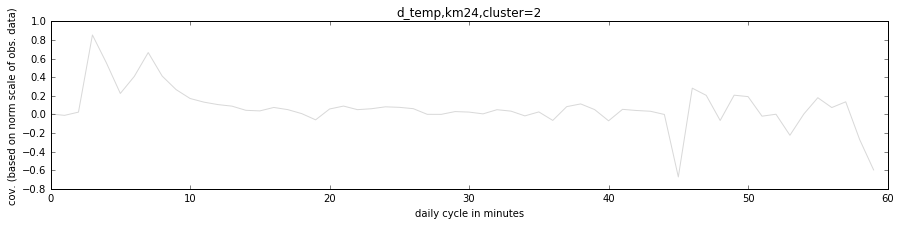

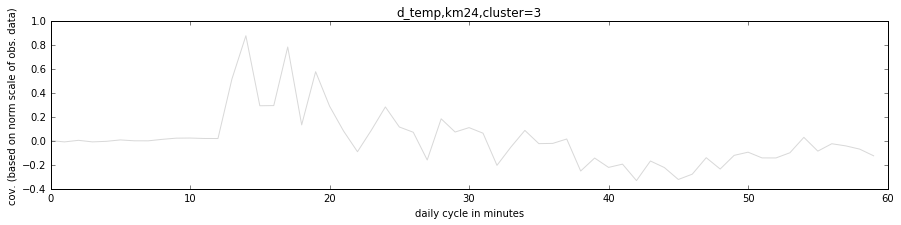

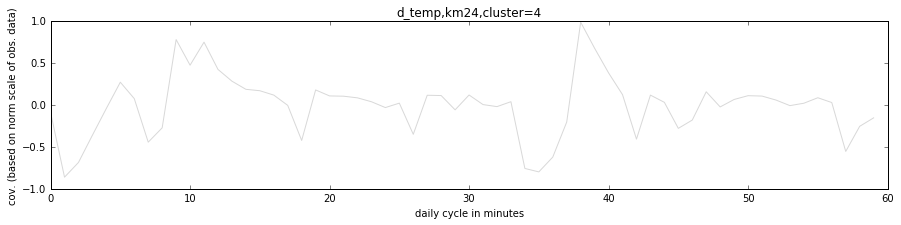

...

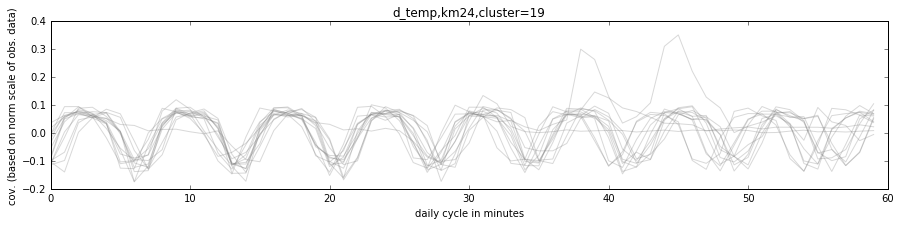

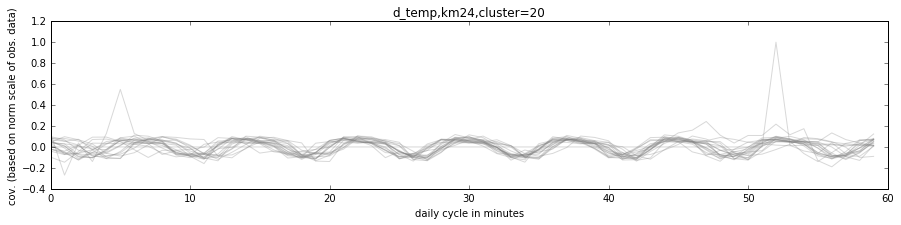

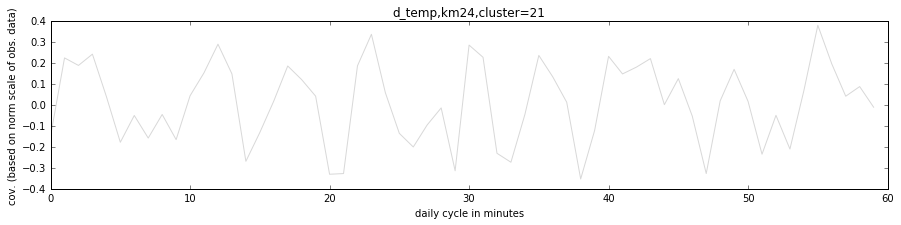

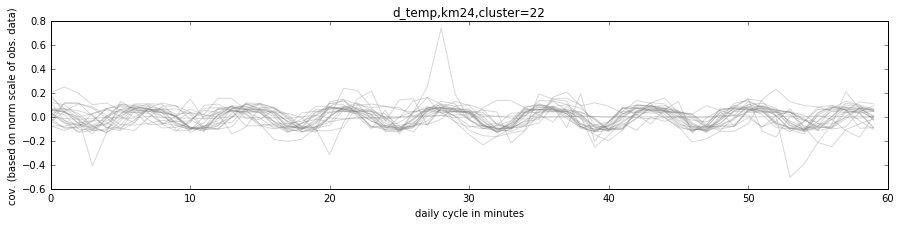

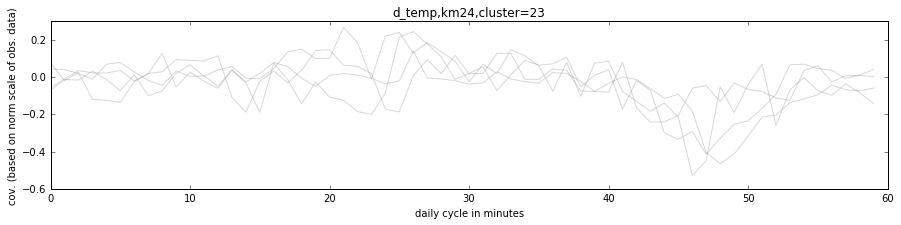

In [67]:
# AIR CONDITION CLUSTER 2,3,4,5,11,13...
plot_cluster_24(dt_results_hour,'km24','d_temp')

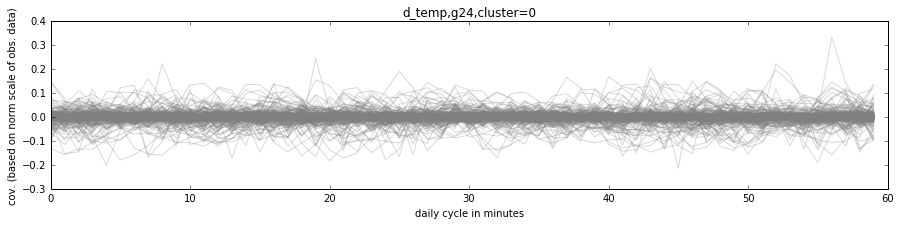

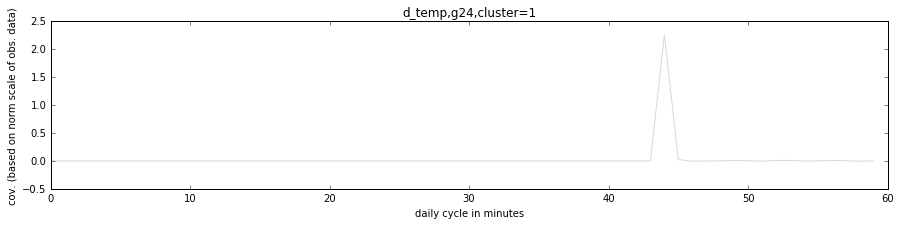

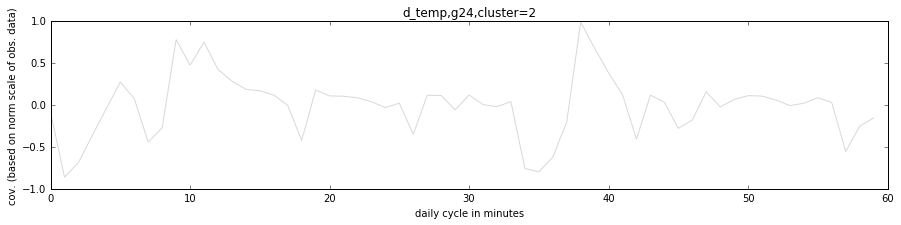

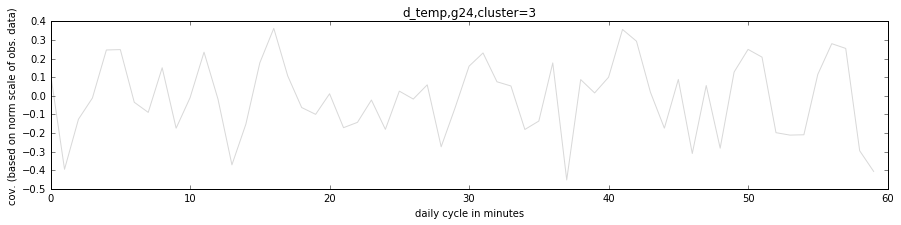

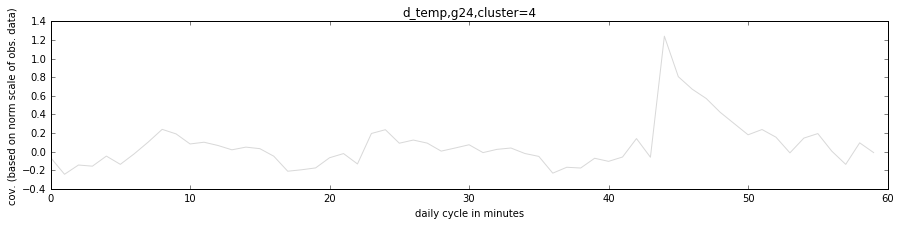

...

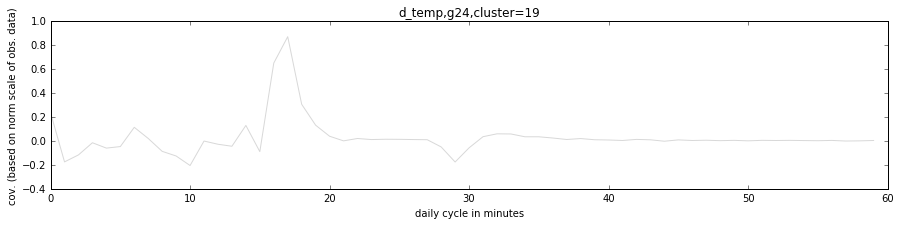

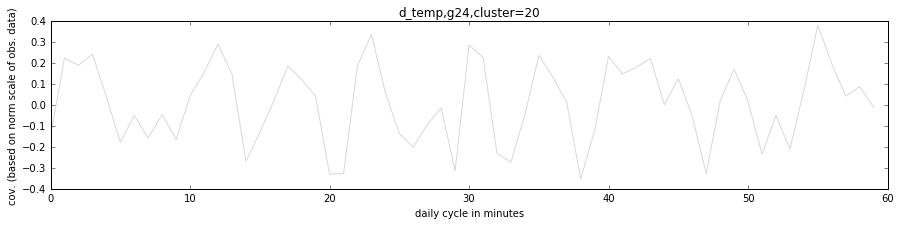

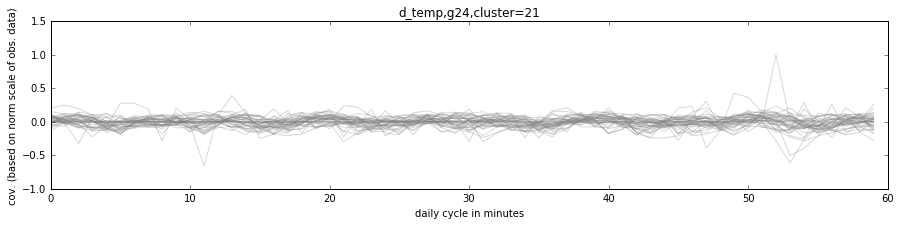

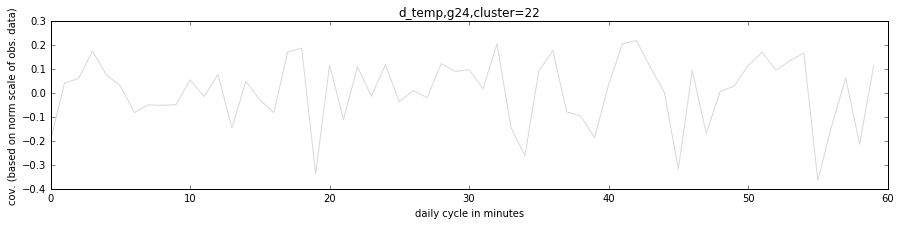

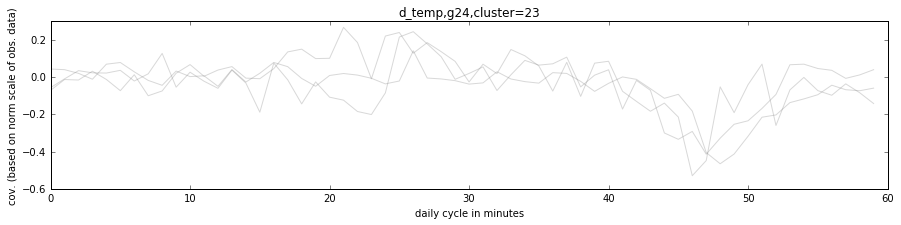

In [68]:
plot_cluster_24(dt_results_hour,'g24','d_temp')

# Next steps
1. Apply labels from clustering (compare time series with overall clustering)
2. Covariance (as time series)
3. Periodicity (as time series)
4. PCA over all features